# Tutorial on the python implementation of MGP-DCNN, with ED sampling

### Reference paper : 


# 0] Prerequisites
- Install
    (a) Pytorch and GPytorch
    (b) Keras and tensorflow
    (c) All other dependencies below

- Clone repo https://github.com/iurteaga/hcm

### Imports

In [1]:
import torch
import gpytorch
import h5py
import pickle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from skopt.space import Real, Integer
from scipy.signal import resample, find_peaks
import sys
import os
import pdb
# New code
sys.path.append('../../src/MGP_DCNN')
from data_processing import * # Some auxiliary functions
from MGP import * # MGP models
from TNN import * # TNN models
from RNN  import * # RNN models
from expected_distance  import * # Expected distance implementation

/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d
Using TensorFlow backend.


### Visualization of data

In [2]:
hormone_labels=['LH', 'FSH', 'E2', 'P4', 'Ih']
# Number of FFT points
n_fft=512

def visualize_data(y_data):
    for i in np.arange(y_data.shape[0]):
        # Cycle_length
        Y = np.fft.fft(y_data[i,:,].T,n_fft)
        max_f_lh=np.argsort(np.abs(Y[0,:int(n_fft/2)])**2)[-1:0:-1][:15]
        y_cycle_length=np.amin(max_f_lh[(max_f_lh>20) & (max_f_lh<40)])
        # Plotting
        for h in np.arange(len(hormone_labels)):
            plt.plot(y_data[i,:,h], label=hormone_labels[h])
            plt.title('Individual number {} with cycle_length of {} days'.format(i, y_cycle_length))
        legend = plt.legend(loc='upper right', ncol=1, shadow=True)
        plt.autoscale(enable=True, axis='x', tight=True)
        plt.show()

In [3]:
def plot_y_reconstruct_and_predict(y_data, subset_of_points,
                                   y_predicted,
                                   nb_individuals_train, nb_individuals_val, nb_individuals_test):
    assert y_data.shape==y_predicted.shape
    # Plot all individuals
    for i in np.arange(y_data.shape[0]):
        # Plotting
        if i<nb_individuals_train:
            individual_type='TRAIN'
        elif i<nb_individuals_train+nb_individuals_val:
            individual_type='TRAIN validation'
        elif i>=nb_individuals_train+nb_individuals_val:
            individual_type='TEST'
        print('{} individual number {}'.format(individual_type, i))
        plt.figure()
        plt.tight_layout()
        for h in np.arange(len(hormone_labels)):
            plt.subplot(3,2,h+1)
            # Training
            plt.axvspan(0, subset_of_points[i].max(), facecolor='g', alpha=0.1)
            plt.scatter(subset_of_points[i], y_data[i,subset_of_points[i],h], marker='x', facecolor='g') # label='Training points'
            # True
            #plt.plot(y_data[i,:,h], label='True {}'.format(hormone_labels[h]))
            plt.plot(y_data[i,:,h])
            # Reconstructed
            #plt.plot(y_predicted[i,:,h], label='Reconstructed {}'.format(hormone_labels[h]))
            plt.plot(y_predicted[i,:,h])
            plt.title(hormone_labels[h])
            #legend = plt.legend(bbox_to_anchor=(1.05,0.95), loc='upper left', ncol=2, shadow=True)
            plt.xlabel('t')
            plt.autoscale(enable=True, axis='x', tight=True)
        plt.subplots_adjust(wspace=1, hspace=1)
        plt.show()

In [4]:
def plot_y_GP_reconstruct_and_predict(y_data, subset_of_points,
                                   y_mean_predicted, y_var_predicted,
                                   nb_individuals_train, nb_individuals_val, nb_individuals_test):
    # Plot all individuals
    for i in np.arange(y_data.shape[0]):
        # Plotting
        if i<nb_individuals_train:
            individual_type='TRAIN'
        elif i<nb_individuals_train+nb_individuals_val:
            individual_type='TRAIN validation'
        elif i>=nb_individuals_train+nb_individuals_val:
            individual_type='TEST'
        print('{} individual number {}'.format(individual_type, i))
        plt.figure()
        plt.tight_layout()
        for h in np.arange(len(hormone_labels)):
            plt.subplot(3,2,h+1)
            # Training
            plt.axvspan(0, subset_of_points[i].max(), facecolor='g', alpha=0.1)
            plt.scatter(subset_of_points[i], y_data[i,subset_of_points[i],h], marker='x', facecolor='g', label='Training points')
            # True
            #plt.plot(y_data[i,:,h], label='True {}'.format(hormone_labels[h]))
            plt.plot(y_data[i,:,h])
            # Reconstructed
            #plt.plot(y_predicted[i,:,h], label='Reconstructed {}'.format(hormone_labels[h]))
            plt.plot(y_mean_predicted[i,:,h])
            plt.fill_between(np.arange(y_predicted[i,:,h].size),
                             y_mean_predicted[i,:,h]-np.sqrt(y_var_predicted[i,:,h]),
                             y_mean_predicted[i,:,h]+np.sqrt(y_var_predicted[i,:,h]),
                             alpha=0.3)
            plt.title(hormone_labels[h])
            #legend = plt.legend(bbox_to_anchor=(1.05,0.95), loc='upper left', ncol=2, shadow=True)
            plt.xlabel('t')
            plt.autoscale(enable=True, axis='x', tight=True)
        plt.subplots_adjust(wspace=1, hspace=1)
        plt.show()

### Import the provided example data

In [5]:
data_file = '../../data/mlhc_2019/realistic_dataset.pickle'
with open(data_file, 'rb') as f:
    y_data=pickle.load(f)

# Shape of dataset
y_data_shape = y_data.shape
print(y_data.shape)

(60, 300, 5)


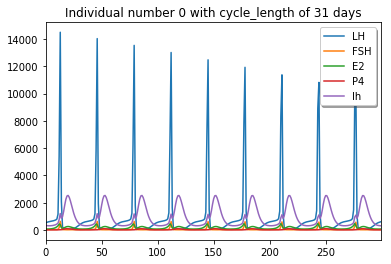

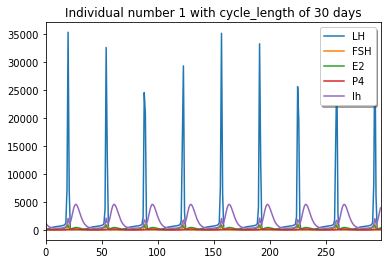

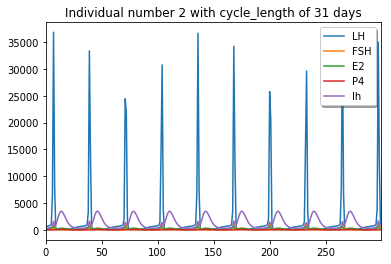

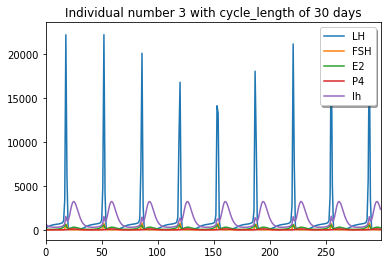

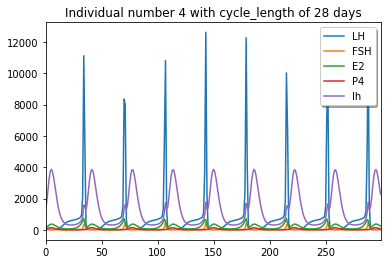

...

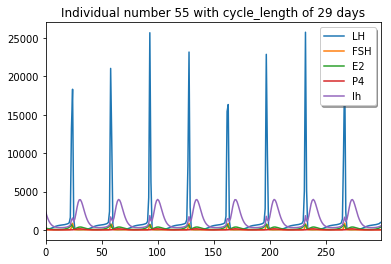

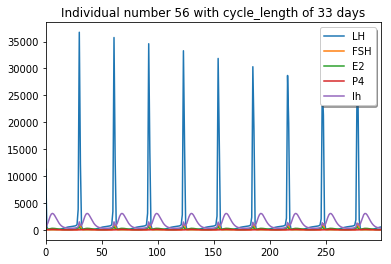

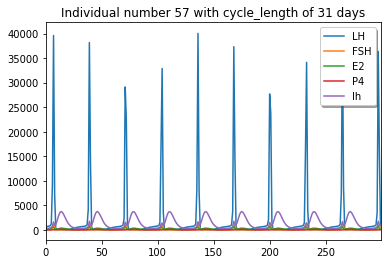

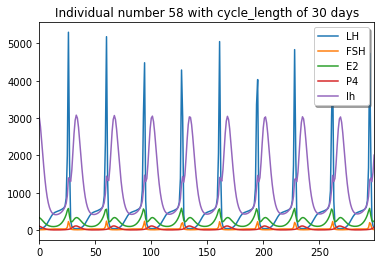

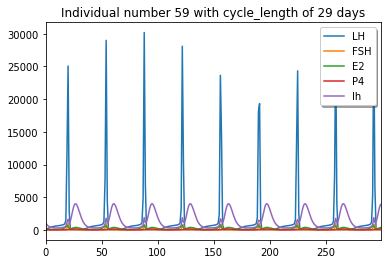

In [6]:
# Visualize original data
visualize_data(y_data)

In [7]:
# If desired, random shuffling of individuals (so that each execution is different)
permutation_index = np.random.permutation(np.arange(y_data_shape[0]))
y_data=y_data[permutation_index]

### Hyperparameters

In [8]:
################## Data related
nb_input_tasks = y_data_shape[-1]   #number of tasks selected for the input and output of the MGP = input DCNN
nb_output_tasks = y_data_shape[-1]  #number of tasks selected for the output of the DCNN

nb_individuals = 60    #number of individuals
nb_individuals_train = 40  #number of individuals for the training of the DCNN
nb_individuals_val = 10   #number of individuals for the validation of the DCNN
nb_individuals_test = 10  #number of individuals for the test of the DCNN
assert(nb_individuals_train + nb_individuals_val + nb_individuals_test == nb_individuals)

nb_time_steps = 105       # number of time steps
nb_train_time_steps = 70  # time limit for the training (limit between reconstruction and forecast)

# number of posterior samples we want to drawn from each individual MGP distribution
nb_samples_per_id = 1000

# Execution type and folder
main_dir='../../results/mlhc_2019'
if not os.path.exists(main_dir):
    os.makedirs(main_dir)
exec_type='MGP_DCNN_tutorial'
if not os.path.exists('{}/{}/trained_models'.format(main_dir,exec_type)):
    os.makedirs('{}/{}/trained_models'.format(main_dir,exec_type))

### Data preprocessing

In [9]:
# Data aligned by peaks
y_data = align_data_on_peak(y_data, length=nb_time_steps, column=0)
# Subset of data to consider
y_data = y_data[:nb_individuals, :nb_time_steps]
y_data_shape = y_data.shape

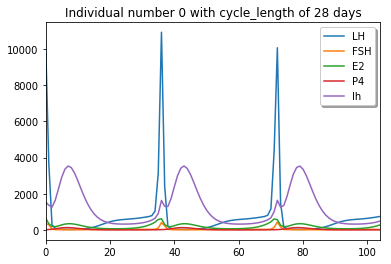

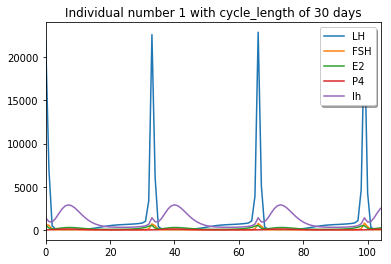

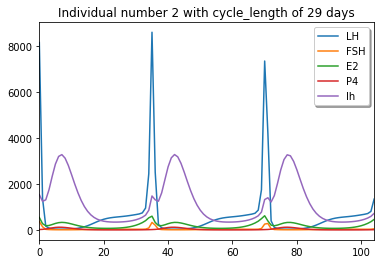

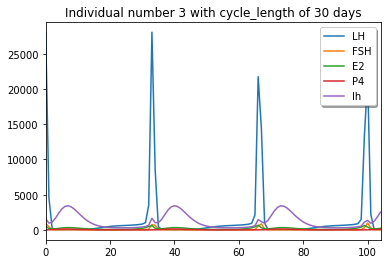

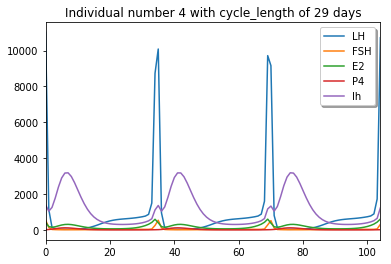

...

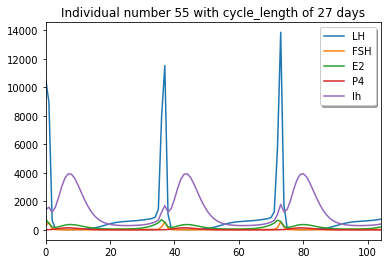

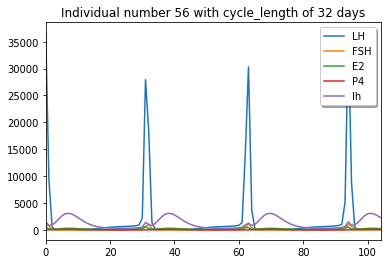

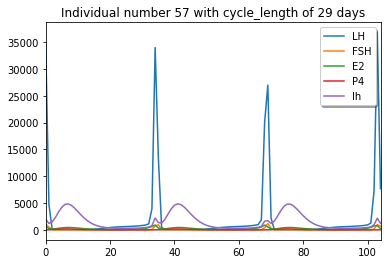

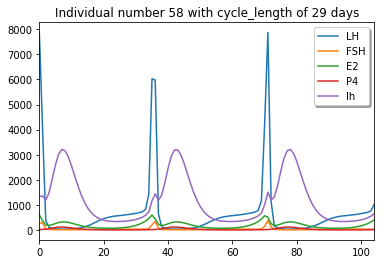

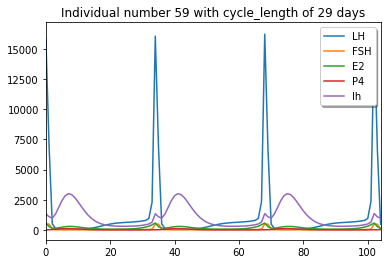

In [10]:
# Visualize data after alignment
visualize_data(y_data)

In [11]:
# Resample data for ED
resampled_data = resample_data_for_ed(y_data)
resampled_data_shape=resampled_data.shape

In [12]:
# Scale data per user and hormone
resampled_scaler=StandardScaler()
resampled_data_train=resampled_scaler.fit_transform(resampled_data[:nb_individuals_train].reshape(-1, resampled_data_shape[-1]))
print(resampled_data_train.mean(axis=(0,1)), resampled_data_train.std(axis=(0,1)))
resampled_data = resampled_scaler.transform(resampled_data.reshape(-1,resampled_data_shape[-1])).reshape(resampled_data_shape)
print(resampled_data.mean(axis=(0,1)), resampled_data.std(axis=(0,1)))


3.3226331738877066e-16 1.0
[ 0.01447082  0.01441991 -0.02325134 -0.01704447 -0.01859735] [1.06625483 1.04903524 0.97792908 0.97914489 0.97878908]


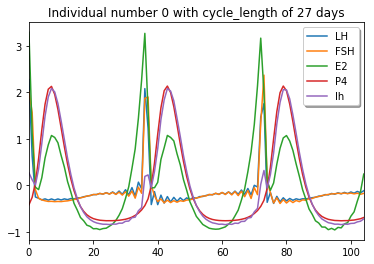

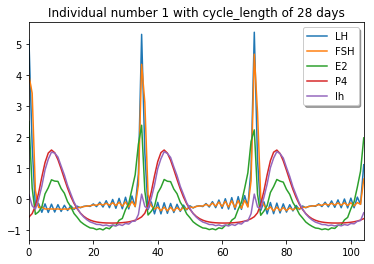

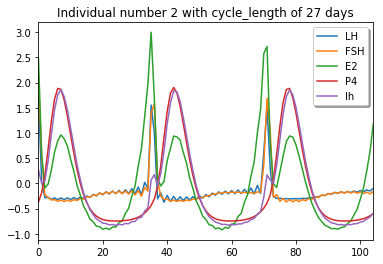

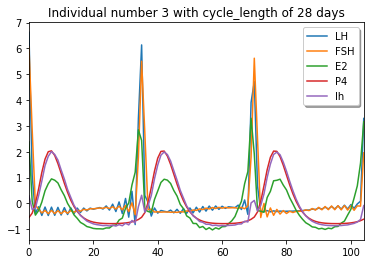

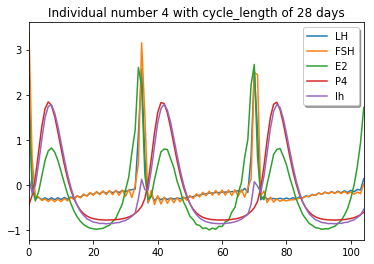

...

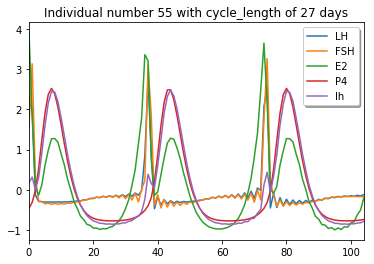

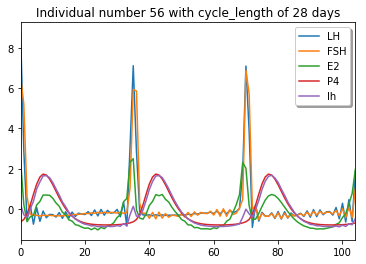

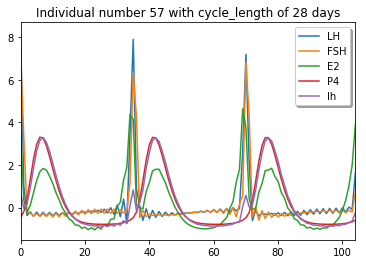

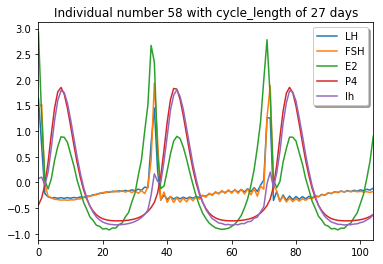

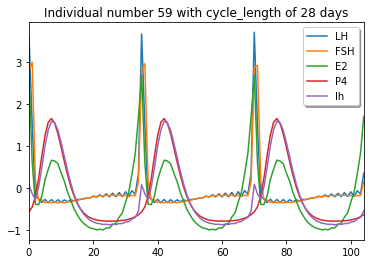

In [13]:
# Visualize data after alignment AND scaling
visualize_data(resampled_data)

In [14]:
# Execution with number of selected points
nb_peaks_selected = 2     # select the 2 first peaks of the first hormone
# And number of points selected for training
nb_selected_points = 10

### Optimal sampling, based on ED

In [15]:
train_sampling_type='ed_sampling_nb_selected_points_{}_nb_peaks_selected_{}'.format(nb_selected_points, nb_peaks_selected)
ed_sampling_list = np.array([])
if ed_sampling_list.size==0:
    # Need to compute list
    # Based on which MGP
    ed_mgp_block_indices =[[0,1],[2,3,4]]
    # Parameters for training the MGP
    ed_mgp_n_iter = 500               # max of iterations for the training of the MGP
    ed_mgp_learning_rate = 0.015  # learning rate for the trainig of the MGP
    ed_mgp_time_kernel = gpytorch.kernels.PeriodicKernel(period_length_prior = gpytorch.priors.NormalPrior(0.31,0.1))
    # Make sure only training data is shared with ED computation
    ed_sampling_list = compute_ed_sampling_list(resampled_data[:nb_individuals_train], nb_train_time_steps, nb_selected_points, ed_mgp_block_indices, ed_mgp_time_kernel, ed_mgp_learning_rate, ed_mgp_n_iter, mgp_smart_end=True, mgp_plot=False)


-------------  NEW POINT 3 out of 10 -------------
Point 0 for individual 0
### BLOCK 0 ###
Iter 1/500 - Loss: 6.535
Iter 51/500 - Loss: 2.801
Iter 101/500 - Loss: 2.103
Iter 151/500 - Loss: 1.651
Iter 201/500 - Loss: 1.230
Iter 251/500 - Loss: 0.844
Iter 301/500 - Loss: 0.513
Iter 351/500 - Loss: 0.267
Iter 401/500 - Loss: 0.128
Iter 451/500 - Loss: 0.072
### BLOCK 1 ###
Iter 1/500 - Loss: 2.899
Iter 51/500 - Loss: 2.144
Iter 101/500 - Loss: 1.754
Iter 151/500 - Loss: 1.422
Iter 201/500 - Loss: 1.173
Iter 251/500 - Loss: 0.977
Iter 301/500 - Loss: 0.802
Iter 351/500 - Loss: 0.657
Iter 401/500 - Loss: 0.542
Iter 451/500 - Loss: 0.475
Point 0 for individual 1
### BLOCK 0 ###
Iter 1/500 - Loss: 8.181
Iter 51/500 - Loss: 4.894
Iter 101/500 - Loss: 4.067
Iter 151/500 - Loss: 3.542
Iter 201/500 - Loss: 3.059
Iter 251/500 - Loss: 2.586
Iter 301/500 - Loss: 2.158
Iter 351/500 - Loss: 1.799
Iter 401/500 - Loss: 1.544
Iter 451/500 - Loss: 1.351
### BLOCK 1 ###
Iter 1/500 - Loss: 3.382
Iter 51/5

Iter 201/500 - Loss: 0.177
Iter 251/500 - Loss: -0.484
Iter 301/500 - Loss: -1.123
Iter 351/500 - Loss: -1.707
Iter 401/500 - Loss: -2.207
Iter 451/500 - Loss: -2.609
Point 0 for individual 14
### BLOCK 0 ###
Iter 1/500 - Loss: 14.290
Iter 51/500 - Loss: 7.577
Iter 101/500 - Loss: 5.635
Iter 151/500 - Loss: 4.841
Iter 201/500 - Loss: 4.395
Iter 251/500 - Loss: 4.084
Iter 301/500 - Loss: 3.829
Iter 351/500 - Loss: 3.593
Iter 401/500 - Loss: 3.357
Iter 451/500 - Loss: 3.111
### BLOCK 1 ###
Iter 1/500 - Loss: 5.335
Iter 51/500 - Loss: 3.358
Iter 101/500 - Loss: 2.495
Iter 151/500 - Loss: 1.802
Iter 201/500 - Loss: 1.126
Iter 251/500 - Loss: 0.472
Iter 301/500 - Loss: -0.162
Iter 351/500 - Loss: -0.775
Iter 401/500 - Loss: -1.372
Iter 451/500 - Loss: -1.950
Point 0 for individual 15
### BLOCK 0 ###
Iter 1/500 - Loss: 10.045
Iter 51/500 - Loss: 5.527
Iter 101/500 - Loss: 4.398
Iter 151/500 - Loss: 3.891
Iter 201/500 - Loss: 3.538
Iter 251/500 - Loss: 3.227
Iter 301/500 - Loss: 2.919
Iter 35

### BLOCK 1 ###
Iter 1/500 - Loss: 2.718
Iter 51/500 - Loss: 2.029
Iter 101/500 - Loss: 1.230
Iter 151/500 - Loss: 0.498
Iter 201/500 - Loss: -0.177
Iter 251/500 - Loss: -0.795
Iter 301/500 - Loss: -1.322
Iter 351/500 - Loss: -1.746
Iter 401/500 - Loss: -2.078
Iter 451/500 - Loss: -2.320
Point 0 for individual 28
### BLOCK 0 ###
Iter 1/500 - Loss: 4.022
Iter 51/500 - Loss: 3.485
Iter 101/500 - Loss: 3.328
Iter 151/500 - Loss: 3.283
Iter 201/500 - Loss: 3.262
Iter 251/500 - Loss: 3.248
Iter 301/500 - Loss: 3.238
Iter 351/500 - Loss: 3.232
Iter 401/500 - Loss: 3.227
Iter 451/500 - Loss: 3.224
### BLOCK 1 ###
Iter 1/500 - Loss: 3.693
Iter 51/500 - Loss: 2.589
Iter 101/500 - Loss: 1.967
Iter 151/500 - Loss: 1.503
Iter 201/500 - Loss: 1.186
Iter 251/500 - Loss: 0.959
Iter 301/500 - Loss: 0.768
Iter 351/500 - Loss: 0.600
Iter 401/500 - Loss: 0.455
Iter 451/500 - Loss: 0.339
Point 0 for individual 29
### BLOCK 0 ###
Iter 1/500 - Loss: 4.472
Iter 51/500 - Loss: 3.803
Iter 101/500 - Loss: 3.620

Iter 51/500 - Loss: 9.371
Iter 101/500 - Loss: 8.229
Iter 151/500 - Loss: 7.777
Iter 201/500 - Loss: 7.537
Iter 251/500 - Loss: 7.389
Iter 301/500 - Loss: 7.291
Iter 351/500 - Loss: 7.222
Iter 401/500 - Loss: 7.171
Iter 451/500 - Loss: 7.131
### BLOCK 1 ###
Iter 1/500 - Loss: 4.531
Iter 51/500 - Loss: 4.128
Iter 101/500 - Loss: 3.971
Iter 151/500 - Loss: 3.912
Iter 201/500 - Loss: 3.874
Iter 251/500 - Loss: 3.847
Iter 301/500 - Loss: 3.827
Iter 351/500 - Loss: 3.813
Iter 401/500 - Loss: 3.803
Iter 451/500 - Loss: 3.796
Point 1 for individual 2
### BLOCK 0 ###
Iter 1/500 - Loss: 4.528
Iter 51/500 - Loss: 4.319
Iter 101/500 - Loss: 4.264
Iter 151/500 - Loss: 4.234
Iter 201/500 - Loss: 4.218
Iter 251/500 - Loss: 4.209
Iter 301/500 - Loss: 4.203
Iter 351/500 - Loss: 4.199
Iter 401/500 - Loss: 4.196
Iter 451/500 - Loss: 4.194
### BLOCK 1 ###
Iter 1/500 - Loss: 4.805
Iter 51/500 - Loss: 4.468
Iter 101/500 - Loss: 4.354
Iter 151/500 - Loss: 4.281
Iter 201/500 - Loss: 4.228
Iter 251/500 - Loss

Iter 451/500 - Loss: 5.337
Point 1 for individual 15
### BLOCK 0 ###
Iter 1/500 - Loss: 13.976
Iter 51/500 - Loss: 9.518
Iter 101/500 - Loss: 8.338
Iter 151/500 - Loss: 7.850
Iter 201/500 - Loss: 7.588
Iter 251/500 - Loss: 7.430
Iter 301/500 - Loss: 7.326
Iter 351/500 - Loss: 7.255
Iter 401/500 - Loss: 7.204
Iter 451/500 - Loss: 7.167
### BLOCK 1 ###
Iter 1/500 - Loss: 4.770
Iter 51/500 - Loss: 4.378
Iter 101/500 - Loss: 4.217
Iter 151/500 - Loss: 4.146
Iter 201/500 - Loss: 4.099
Iter 251/500 - Loss: 4.064
Iter 301/500 - Loss: 4.040
Iter 351/500 - Loss: 4.024
Iter 401/500 - Loss: 4.013
Iter 451/500 - Loss: 4.005
Point 1 for individual 16
### BLOCK 0 ###
Iter 1/500 - Loss: 4.013
Iter 51/500 - Loss: 3.466
Iter 101/500 - Loss: 3.131
Iter 151/500 - Loss: 3.041
Iter 201/500 - Loss: 2.975
Iter 251/500 - Loss: 2.932
Iter 301/500 - Loss: 2.905
Iter 351/500 - Loss: 2.888
Iter 401/500 - Loss: 2.877
Iter 451/500 - Loss: 2.870
### BLOCK 1 ###
Iter 1/500 - Loss: 4.570
Iter 51/500 - Loss: 4.288
Iter

Iter 251/500 - Loss: 5.284
Iter 301/500 - Loss: 5.272
Iter 351/500 - Loss: 5.265
Iter 401/500 - Loss: 5.260
Iter 451/500 - Loss: 5.256
Point 1 for individual 29
### BLOCK 0 ###
Iter 1/500 - Loss: 6.475
Iter 51/500 - Loss: 5.729
Iter 101/500 - Loss: 5.548
Iter 151/500 - Loss: 5.478
Iter 201/500 - Loss: 5.440
Iter 251/500 - Loss: 5.417
Iter 301/500 - Loss: 5.401
Iter 351/500 - Loss: 5.391
Iter 401/500 - Loss: 5.385
Iter 451/500 - Loss: 5.380
### BLOCK 1 ###
Iter 1/500 - Loss: 6.731
Iter 51/500 - Loss: 5.878
Iter 101/500 - Loss: 5.621
Iter 151/500 - Loss: 5.469
Iter 201/500 - Loss: 5.378
Iter 251/500 - Loss: 5.330
Iter 301/500 - Loss: 5.304
Iter 351/500 - Loss: 5.288
Iter 401/500 - Loss: 5.278
Iter 451/500 - Loss: 5.270
Point 1 for individual 30
### BLOCK 0 ###
Iter 1/500 - Loss: 4.614
Iter 51/500 - Loss: 4.373
Iter 101/500 - Loss: 4.344
Iter 151/500 - Loss: 4.331
Iter 201/500 - Loss: 4.324
Iter 251/500 - Loss: 4.320
Iter 301/500 - Loss: 4.317
Iter 351/500 - Loss: 4.316
Iter 401/500 - Los

Iter 401/500 - Loss: 5.546
Iter 451/500 - Loss: 5.541
### BLOCK 1 ###
Iter 1/500 - Loss: 7.218
Iter 51/500 - Loss: 6.780
Iter 101/500 - Loss: 6.549
Iter 151/500 - Loss: 6.442
Iter 201/500 - Loss: 6.344
Iter 251/500 - Loss: 6.254
Iter 301/500 - Loss: 6.190
Iter 351/500 - Loss: 6.153
Iter 401/500 - Loss: 6.132
Iter 451/500 - Loss: 6.119
Point 2 for individual 3
### BLOCK 0 ###
Iter 1/500 - Loss: 22.808
Iter 51/500 - Loss: 15.894
Iter 101/500 - Loss: 13.609
Iter 151/500 - Loss: 12.554
Iter 201/500 - Loss: 11.950
Iter 251/500 - Loss: 11.563
Iter 301/500 - Loss: 11.298
Iter 351/500 - Loss: 11.107
Iter 401/500 - Loss: 10.964
Iter 451/500 - Loss: 10.854
### BLOCK 1 ###
Iter 1/500 - Loss: 6.579
Iter 51/500 - Loss: 6.340
Iter 101/500 - Loss: 6.240
Iter 151/500 - Loss: 6.177
Iter 201/500 - Loss: 6.138
Iter 251/500 - Loss: 6.115
Iter 301/500 - Loss: 6.101
Iter 351/500 - Loss: 6.091
Iter 401/500 - Loss: 6.085
Iter 451/500 - Loss: 6.081
Point 2 for individual 4
### BLOCK 0 ###
Iter 1/500 - Loss: 8.

Iter 151/500 - Loss: 3.900
Iter 201/500 - Loss: 3.834
Iter 251/500 - Loss: 3.795
Iter 301/500 - Loss: 3.771
Iter 351/500 - Loss: 3.756
Iter 401/500 - Loss: 3.747
Iter 451/500 - Loss: 3.740
### BLOCK 1 ###
Iter 1/500 - Loss: 6.625
Iter 51/500 - Loss: 6.174
Iter 101/500 - Loss: 6.008
Iter 151/500 - Loss: 5.919
Iter 201/500 - Loss: 5.870
Iter 251/500 - Loss: 5.843
Iter 301/500 - Loss: 5.827
Iter 351/500 - Loss: 5.816
Iter 401/500 - Loss: 5.809
Iter 451/500 - Loss: 5.803
Point 2 for individual 17
### BLOCK 0 ###
Iter 1/500 - Loss: 7.475
Iter 51/500 - Loss: 7.088
Iter 101/500 - Loss: 6.831
Iter 151/500 - Loss: 6.497
Iter 201/500 - Loss: 6.188
Iter 251/500 - Loss: 6.148
Iter 301/500 - Loss: 6.130
Iter 351/500 - Loss: 6.119
Iter 401/500 - Loss: 6.112
Iter 451/500 - Loss: 6.107
### BLOCK 1 ###
Iter 1/500 - Loss: 7.914
Iter 51/500 - Loss: 7.347
Iter 101/500 - Loss: 7.222
Iter 151/500 - Loss: 7.159
Iter 201/500 - Loss: 7.123
Iter 251/500 - Loss: 7.103
Iter 301/500 - Loss: 7.091
Iter 351/500 - Lo

Iter 101/500 - Loss: 4.638
Iter 151/500 - Loss: 3.926
Iter 201/500 - Loss: 3.174
Iter 251/500 - Loss: 2.441
Iter 301/500 - Loss: 1.783
Iter 351/500 - Loss: 1.268
Iter 401/500 - Loss: 0.954
Iter 451/500 - Loss: 0.825
### BLOCK 1 ###
Iter 1/500 - Loss: 6.946
Iter 51/500 - Loss: 6.114
Iter 101/500 - Loss: 5.345
Iter 151/500 - Loss: 4.775
Iter 201/500 - Loss: 4.434
Iter 251/500 - Loss: 4.272
Iter 301/500 - Loss: 4.168
Iter 351/500 - Loss: 4.068
Iter 401/500 - Loss: 3.996
Iter 451/500 - Loss: 3.956
Point 2 for individual 31
### BLOCK 0 ###
Iter 1/500 - Loss: 9.488
Iter 51/500 - Loss: 7.980
Iter 101/500 - Loss: 7.259
Iter 151/500 - Loss: 6.690
Iter 201/500 - Loss: 6.176
Iter 251/500 - Loss: 5.792
Iter 301/500 - Loss: 5.573
Iter 351/500 - Loss: 5.454
Iter 401/500 - Loss: 5.388
Iter 451/500 - Loss: 5.360
### BLOCK 1 ###
Iter 1/500 - Loss: 6.409
Iter 51/500 - Loss: 5.620
Iter 101/500 - Loss: 4.967
Iter 151/500 - Loss: 4.418
Iter 201/500 - Loss: 4.027
Iter 251/500 - Loss: 3.737
Iter 301/500 - Lo

Iter 51/500 - Loss: 6.693
Iter 101/500 - Loss: 5.611
Iter 151/500 - Loss: 4.487
Iter 201/500 - Loss: 3.399
Iter 251/500 - Loss: 2.417
Iter 301/500 - Loss: 1.651
Iter 351/500 - Loss: 1.141
Iter 401/500 - Loss: 0.867
Iter 451/500 - Loss: 0.706
### BLOCK 1 ###
Iter 1/500 - Loss: 7.757
Iter 51/500 - Loss: 6.686
Iter 101/500 - Loss: 5.884
Iter 151/500 - Loss: 5.188
Iter 201/500 - Loss: 4.380
Iter 251/500 - Loss: 3.947
Iter 301/500 - Loss: 3.688
Iter 351/500 - Loss: 3.404
Iter 401/500 - Loss: 3.173
Iter 451/500 - Loss: 2.967
Point 3 for individual 5
### BLOCK 0 ###
Iter 1/500 - Loss: 7.441
Iter 51/500 - Loss: 6.396
Iter 101/500 - Loss: 5.243
Iter 151/500 - Loss: 4.157
Iter 201/500 - Loss: 3.129
Iter 251/500 - Loss: 2.186
Iter 301/500 - Loss: 1.382
Iter 351/500 - Loss: 0.797
Iter 401/500 - Loss: 0.476
Iter 451/500 - Loss: 0.361
### BLOCK 1 ###
Iter 1/500 - Loss: 9.158
Iter 51/500 - Loss: 7.923
Iter 101/500 - Loss: 7.126
Iter 151/500 - Loss: 6.521
Iter 201/500 - Loss: 6.114
Iter 251/500 - Loss

Iter 101/500 - Loss: 7.876
Iter 151/500 - Loss: 6.745
Iter 201/500 - Loss: 5.891
Iter 251/500 - Loss: 5.495
Iter 301/500 - Loss: 5.423
Iter 351/500 - Loss: 5.419
Iter 401/500 - Loss: 5.417
Iter 451/500 - Loss: 5.415
### BLOCK 1 ###
Iter 1/500 - Loss: 10.350
Iter 51/500 - Loss: 8.822
Iter 101/500 - Loss: 8.223
Iter 151/500 - Loss: 7.689
Iter 201/500 - Loss: 7.192
Iter 251/500 - Loss: 5.996
Iter 301/500 - Loss: 5.624
Point 3 for individual 20
### BLOCK 0 ###
Iter 1/500 - Loss: 11.766
Iter 51/500 - Loss: 9.223
Iter 101/500 - Loss: 7.971
Iter 151/500 - Loss: 6.962
Iter 201/500 - Loss: 6.035
Iter 251/500 - Loss: 5.070
Iter 301/500 - Loss: 4.073
Iter 351/500 - Loss: 3.107
Iter 401/500 - Loss: 2.221
Iter 451/500 - Loss: 1.478
### BLOCK 1 ###
Iter 1/500 - Loss: 8.270
Iter 51/500 - Loss: 7.470
Iter 101/500 - Loss: 6.632
Iter 151/500 - Loss: 6.047
Iter 201/500 - Loss: 4.991
Iter 251/500 - Loss: 4.539
Iter 301/500 - Loss: 4.255
Iter 351/500 - Loss: 4.021
Iter 401/500 - Loss: 3.850
Iter 451/500 - 

Iter 201/500 - Loss: 5.124
Iter 251/500 - Loss: 4.953
Iter 301/500 - Loss: 4.852
Iter 351/500 - Loss: 4.761
Iter 401/500 - Loss: 4.683
Iter 451/500 - Loss: 4.623
Point 3 for individual 34
### BLOCK 0 ###
Iter 1/500 - Loss: 7.559
Iter 51/500 - Loss: 7.208
Iter 101/500 - Loss: 6.414
Iter 151/500 - Loss: 4.990
Iter 201/500 - Loss: 3.785
Iter 251/500 - Loss: 2.796
Iter 301/500 - Loss: 2.124
Iter 351/500 - Loss: 1.818
Iter 401/500 - Loss: 1.746
Iter 451/500 - Loss: 1.738
### BLOCK 1 ###
Iter 1/500 - Loss: 10.578
Iter 51/500 - Loss: 8.989
Iter 101/500 - Loss: 8.356
Iter 151/500 - Loss: 7.894
Iter 201/500 - Loss: 6.947
Iter 251/500 - Loss: 6.359
Iter 301/500 - Loss: 6.166
Iter 351/500 - Loss: 6.118
Iter 401/500 - Loss: 6.062
Iter 451/500 - Loss: 5.989
Point 3 for individual 35
### BLOCK 0 ###
Iter 1/500 - Loss: 14.604
Iter 51/500 - Loss: 9.931
Iter 101/500 - Loss: 8.724
Iter 151/500 - Loss: 7.843
Iter 201/500 - Loss: 6.999
Iter 251/500 - Loss: 6.160
Iter 301/500 - Loss: 5.372
Iter 351/500 - L

Iter 401/500 - Loss: 0.881
Iter 451/500 - Loss: 0.387
### BLOCK 1 ###
Iter 1/500 - Loss: 10.441
Iter 51/500 - Loss: 9.424
Iter 101/500 - Loss: 9.117
Iter 151/500 - Loss: 8.371
Iter 201/500 - Loss: 7.159
Iter 251/500 - Loss: 6.684
Iter 301/500 - Loss: 6.531
Iter 351/500 - Loss: 6.443
Point 4 for individual 8
### BLOCK 0 ###
Iter 1/500 - Loss: 8.219
Iter 51/500 - Loss: 6.618
Iter 101/500 - Loss: 5.281
Iter 151/500 - Loss: 3.881
Iter 201/500 - Loss: 2.528
Iter 251/500 - Loss: 1.205
Iter 301/500 - Loss: -0.000
Iter 351/500 - Loss: -1.031
Iter 401/500 - Loss: -1.819
Iter 451/500 - Loss: -2.313
### BLOCK 1 ###
Iter 1/500 - Loss: 9.648
Iter 51/500 - Loss: 8.236
Iter 101/500 - Loss: 6.765
Iter 151/500 - Loss: 5.769
Iter 201/500 - Loss: 4.876
Iter 251/500 - Loss: 4.230
Iter 301/500 - Loss: 3.858
Iter 351/500 - Loss: 3.614
Iter 401/500 - Loss: 3.400
Iter 451/500 - Loss: 3.207
Point 4 for individual 9
### BLOCK 0 ###
Iter 1/500 - Loss: 19.171
Iter 51/500 - Loss: 13.893
Iter 101/500 - Loss: 12.250

Iter 101/500 - Loss: 7.976
Iter 151/500 - Loss: 6.562
Iter 201/500 - Loss: 5.399
Iter 251/500 - Loss: 4.615
Iter 301/500 - Loss: 4.272
Iter 351/500 - Loss: 4.200
Iter 401/500 - Loss: 4.195
Iter 451/500 - Loss: 4.194
### BLOCK 1 ###
Iter 1/500 - Loss: 10.331
Iter 51/500 - Loss: 8.895
Iter 101/500 - Loss: 7.715
Iter 151/500 - Loss: 6.876
Iter 201/500 - Loss: 6.375
Iter 251/500 - Loss: 6.087
Iter 301/500 - Loss: 5.931
Iter 351/500 - Loss: 5.842
Iter 401/500 - Loss: 5.804
Iter 451/500 - Loss: 5.787
Point 4 for individual 23
### BLOCK 0 ###
Iter 1/500 - Loss: 11.995
Iter 51/500 - Loss: 9.916
Iter 101/500 - Loss: 8.350
Iter 151/500 - Loss: 6.934
Iter 201/500 - Loss: 5.759
### BLOCK 1 ###
Iter 1/500 - Loss: 10.280
Iter 51/500 - Loss: 9.004
Iter 101/500 - Loss: 7.857
Iter 151/500 - Loss: 6.989
Iter 201/500 - Loss: 6.193
Iter 251/500 - Loss: 5.521
Iter 301/500 - Loss: 5.074
Iter 351/500 - Loss: 4.783
Iter 401/500 - Loss: 4.513
Iter 451/500 - Loss: 4.301
Point 4 for individual 24
### BLOCK 0 ###

Iter 301/500 - Loss: 2.417
Iter 351/500 - Loss: 1.699
Iter 401/500 - Loss: 1.293
Iter 451/500 - Loss: 1.145
### BLOCK 1 ###
Iter 1/500 - Loss: 9.715
Iter 51/500 - Loss: 8.403
Iter 101/500 - Loss: 7.465
Iter 151/500 - Loss: 6.628
Iter 201/500 - Loss: 6.090
Iter 251/500 - Loss: 5.801
Iter 301/500 - Loss: 5.683
Iter 351/500 - Loss: 5.627
Iter 401/500 - Loss: 5.587
Iter 451/500 - Loss: 5.556
Point 4 for individual 37
### BLOCK 0 ###
Iter 1/500 - Loss: 14.683
Iter 51/500 - Loss: 11.525
Iter 101/500 - Loss: 9.813
Iter 151/500 - Loss: 8.194
Iter 201/500 - Loss: 6.623
Iter 251/500 - Loss: 5.338
Iter 301/500 - Loss: 4.369
Iter 351/500 - Loss: 3.754
Iter 401/500 - Loss: 3.248
Iter 451/500 - Loss: 2.989
### BLOCK 1 ###
Iter 1/500 - Loss: 9.672
Iter 51/500 - Loss: 8.367
Iter 101/500 - Loss: 7.169
Iter 151/500 - Loss: 6.323
Iter 201/500 - Loss: 5.598
Iter 251/500 - Loss: 5.081
Iter 301/500 - Loss: 4.700
Iter 351/500 - Loss: 4.377
Iter 401/500 - Loss: 4.138
Iter 451/500 - Loss: 3.952
Point 4 for ind

Iter 351/500 - Loss: 4.936
Iter 401/500 - Loss: 4.915
Iter 451/500 - Loss: 4.899
Point 5 for individual 11
### BLOCK 0 ###
Iter 1/500 - Loss: 24.653
Iter 51/500 - Loss: 18.721
Iter 101/500 - Loss: 17.091
Iter 151/500 - Loss: 16.170
Iter 201/500 - Loss: 15.373
Iter 251/500 - Loss: 14.563
Iter 301/500 - Loss: 13.657
Iter 351/500 - Loss: 12.577
Iter 401/500 - Loss: 11.363
Iter 451/500 - Loss: 10.244
### BLOCK 1 ###
Iter 1/500 - Loss: 11.676
Iter 51/500 - Loss: 11.036
Iter 101/500 - Loss: 10.175
Iter 151/500 - Loss: 9.692
Iter 201/500 - Loss: 9.611
Iter 251/500 - Loss: 9.559
Iter 301/500 - Loss: 9.522
Iter 351/500 - Loss: 9.496
Iter 401/500 - Loss: 9.478
Iter 451/500 - Loss: 9.465
Point 5 for individual 12
### BLOCK 0 ###
Iter 1/500 - Loss: 10.795
Iter 51/500 - Loss: 9.593
Iter 101/500 - Loss: 7.963
Iter 151/500 - Loss: 6.019
Iter 201/500 - Loss: 4.294
Iter 251/500 - Loss: 2.709
Iter 301/500 - Loss: 1.250
Iter 351/500 - Loss: -0.047
Iter 401/500 - Loss: -1.097
Iter 451/500 - Loss: -1.841
#

### BLOCK 1 ###
Iter 1/500 - Loss: 11.416
Iter 51/500 - Loss: 10.246
Iter 101/500 - Loss: 9.481
Iter 151/500 - Loss: 8.771
Iter 201/500 - Loss: 8.641
Iter 251/500 - Loss: 8.594
Iter 301/500 - Loss: 8.557
Iter 351/500 - Loss: 8.530
Iter 401/500 - Loss: 8.511
Iter 451/500 - Loss: 8.498
Point 5 for individual 25
### BLOCK 0 ###
Iter 1/500 - Loss: 19.814
Iter 51/500 - Loss: 16.830
Iter 101/500 - Loss: 15.966
Iter 151/500 - Loss: 15.141
Iter 201/500 - Loss: 14.001
Iter 251/500 - Loss: 12.518
Iter 301/500 - Loss: 10.975
Iter 351/500 - Loss: 9.799
Iter 401/500 - Loss: 9.242
Iter 451/500 - Loss: 9.123
### BLOCK 1 ###
Iter 1/500 - Loss: 14.745
Iter 51/500 - Loss: 13.521
Iter 101/500 - Loss: 12.962
Iter 151/500 - Loss: 12.602
Iter 201/500 - Loss: 11.908
Iter 251/500 - Loss: 11.381
Iter 301/500 - Loss: 11.276
Iter 351/500 - Loss: 11.232
Iter 401/500 - Loss: 11.208
Iter 451/500 - Loss: 11.193
Point 5 for individual 26
### BLOCK 0 ###
Iter 1/500 - Loss: 33.243
Iter 51/500 - Loss: 22.293
Iter 101/50

Iter 151/500 - Loss: 14.475
Iter 201/500 - Loss: 13.796
Iter 251/500 - Loss: 13.072
Iter 301/500 - Loss: 12.228
Iter 351/500 - Loss: 11.185
Iter 401/500 - Loss: 9.918
Iter 451/500 - Loss: 8.542
### BLOCK 1 ###
Iter 1/500 - Loss: 11.804
Iter 51/500 - Loss: 10.568
Iter 101/500 - Loss: 10.050
Iter 151/500 - Loss: 9.379
Iter 201/500 - Loss: 8.966
Iter 251/500 - Loss: 8.857
Iter 301/500 - Loss: 8.835
Iter 351/500 - Loss: 8.811
Iter 401/500 - Loss: 8.782
Iter 451/500 - Loss: 8.754
Point 5 for individual 39
### BLOCK 0 ###
Iter 1/500 - Loss: 28.617
Iter 51/500 - Loss: 19.792
Iter 101/500 - Loss: 17.589
Iter 151/500 - Loss: 16.563
Iter 201/500 - Loss: 15.857
Iter 251/500 - Loss: 15.249
Iter 301/500 - Loss: 14.636
Iter 351/500 - Loss: 13.953
Iter 401/500 - Loss: 13.161
Iter 451/500 - Loss: 12.240
### BLOCK 1 ###
Iter 1/500 - Loss: 11.502
Iter 51/500 - Loss: 9.963
Iter 101/500 - Loss: 8.847
Iter 151/500 - Loss: 8.269
Iter 201/500 - Loss: 7.665
Iter 251/500 - Loss: 7.162
Iter 301/500 - Loss: 6.88

Iter 151/500 - Loss: 11.338
Iter 201/500 - Loss: 10.843
Iter 251/500 - Loss: 10.709
Iter 301/500 - Loss: 10.671
Iter 351/500 - Loss: 10.616
Iter 401/500 - Loss: 10.558
Iter 451/500 - Loss: 10.512
Point 6 for individual 12
### BLOCK 0 ###
Iter 1/500 - Loss: 12.959
Iter 51/500 - Loss: 12.138
Iter 101/500 - Loss: 9.992
Iter 151/500 - Loss: 7.510
Iter 201/500 - Loss: 6.071
Iter 251/500 - Loss: 5.502
Iter 301/500 - Loss: 5.414
Iter 351/500 - Loss: 5.411
Iter 401/500 - Loss: 5.411
Iter 451/500 - Loss: 5.411
### BLOCK 1 ###
Iter 1/500 - Loss: 14.459
Iter 51/500 - Loss: 13.448
Iter 101/500 - Loss: 12.823
Iter 151/500 - Loss: 11.503
Iter 201/500 - Loss: 10.725
Iter 251/500 - Loss: 10.549
Iter 301/500 - Loss: 10.534
Iter 351/500 - Loss: 10.525
Iter 401/500 - Loss: 10.516
Iter 451/500 - Loss: 10.507
Point 6 for individual 13
### BLOCK 0 ###
Iter 1/500 - Loss: 13.501
Iter 51/500 - Loss: 12.073
Iter 101/500 - Loss: 10.493
Iter 151/500 - Loss: 8.715
Iter 201/500 - Loss: 7.383
Iter 251/500 - Loss: 6.

Iter 201/500 - Loss: 18.709
Iter 251/500 - Loss: 18.297
Iter 301/500 - Loss: 17.970
Iter 351/500 - Loss: 17.690
Iter 401/500 - Loss: 17.446
Iter 451/500 - Loss: 17.237
### BLOCK 1 ###
Iter 1/500 - Loss: 15.853
Iter 51/500 - Loss: 14.252
Iter 101/500 - Loss: 13.520
Iter 151/500 - Loss: 12.924
Iter 201/500 - Loss: 12.603
Iter 251/500 - Loss: 12.524
Iter 301/500 - Loss: 12.494
Iter 351/500 - Loss: 12.474
Iter 401/500 - Loss: 12.458
Iter 451/500 - Loss: 12.447
Point 6 for individual 26
### BLOCK 0 ###
Iter 1/500 - Loss: 44.711
Iter 51/500 - Loss: 30.110
Iter 101/500 - Loss: 24.446
Iter 151/500 - Loss: 22.179
Iter 201/500 - Loss: 21.034
Iter 251/500 - Loss: 20.375
Iter 301/500 - Loss: 19.946
Iter 351/500 - Loss: 19.633
Iter 401/500 - Loss: 19.381
Iter 451/500 - Loss: 19.163
### BLOCK 1 ###
Iter 1/500 - Loss: 11.575
Iter 51/500 - Loss: 10.370
Iter 101/500 - Loss: 9.686
Iter 151/500 - Loss: 9.006
Iter 201/500 - Loss: 8.581
Iter 251/500 - Loss: 8.436
Iter 301/500 - Loss: 8.400
Iter 351/500 - L

Iter 301/500 - Loss: 9.682
Iter 351/500 - Loss: 9.653
Iter 401/500 - Loss: 9.622
Iter 451/500 - Loss: 9.595
Point 6 for individual 39
### BLOCK 0 ###
Iter 1/500 - Loss: 32.609
Iter 51/500 - Loss: 23.126
Iter 101/500 - Loss: 20.534
Iter 151/500 - Loss: 19.418
Iter 201/500 - Loss: 18.732
Iter 251/500 - Loss: 18.198
Iter 301/500 - Loss: 17.709
Iter 351/500 - Loss: 17.209
Iter 401/500 - Loss: 16.666
Iter 451/500 - Loss: 16.066
### BLOCK 1 ###
Iter 1/500 - Loss: 11.919
Iter 51/500 - Loss: 10.153
Iter 101/500 - Loss: 9.166
Iter 151/500 - Loss: 8.380
Iter 201/500 - Loss: 7.767
Iter 251/500 - Loss: 7.423
Iter 301/500 - Loss: 7.311
Iter 351/500 - Loss: 7.279
Iter 401/500 - Loss: 7.255
Iter 451/500 - Loss: 7.231
#################### CURRENT ED LIST with 9 points: [0, 35, 43, 58, 29, 50, 4, 36, 7]
-------------  NEW POINT 10 out of 10 -------------
Point 7 for individual 0
### BLOCK 0 ###
Iter 1/500 - Loss: 13.498
Iter 51/500 - Loss: 12.333
Iter 101/500 - Loss: 10.802
Iter 151/500 - Loss: 9.041
I

Iter 101/500 - Loss: 11.458
Iter 151/500 - Loss: 9.855
Iter 201/500 - Loss: 8.278
Iter 251/500 - Loss: 6.960
Iter 301/500 - Loss: 6.110
Iter 351/500 - Loss: 5.762
Iter 401/500 - Loss: 5.689
Iter 451/500 - Loss: 5.682
### BLOCK 1 ###
Iter 1/500 - Loss: 17.424
Iter 51/500 - Loss: 15.424
Iter 101/500 - Loss: 14.317
Iter 151/500 - Loss: 13.131
Iter 201/500 - Loss: 12.382
Iter 251/500 - Loss: 12.156
Iter 301/500 - Loss: 12.130
Iter 351/500 - Loss: 12.123
Iter 401/500 - Loss: 12.116
Iter 451/500 - Loss: 12.107
Point 7 for individual 13
### BLOCK 0 ###
Iter 1/500 - Loss: 13.543
Iter 51/500 - Loss: 12.100
Iter 101/500 - Loss: 10.332
Iter 151/500 - Loss: 8.765
Iter 201/500 - Loss: 7.627
Iter 251/500 - Loss: 7.076
Iter 301/500 - Loss: 6.943
Iter 351/500 - Loss: 6.930
Iter 401/500 - Loss: 6.930
Iter 451/500 - Loss: 6.930
### BLOCK 1 ###
Iter 1/500 - Loss: 13.109
Iter 51/500 - Loss: 11.330
Iter 101/500 - Loss: 10.452
Iter 151/500 - Loss: 9.554
Iter 201/500 - Loss: 8.695
Iter 251/500 - Loss: 8.056


Iter 151/500 - Loss: 15.841
Iter 201/500 - Loss: 15.010
Iter 251/500 - Loss: 14.676
Iter 301/500 - Loss: 14.602
Iter 351/500 - Loss: 14.555
Iter 401/500 - Loss: 14.519
Iter 451/500 - Loss: 14.491
Point 7 for individual 26
### BLOCK 0 ###
Iter 1/500 - Loss: 47.454
Iter 51/500 - Loss: 30.345
Iter 101/500 - Loss: 25.730
Iter 151/500 - Loss: 23.939
Iter 201/500 - Loss: 22.996
Iter 251/500 - Loss: 22.400
Iter 301/500 - Loss: 21.969
Iter 351/500 - Loss: 21.622
Iter 401/500 - Loss: 21.318
Iter 451/500 - Loss: 21.036
### BLOCK 1 ###
Iter 1/500 - Loss: 13.754
Iter 51/500 - Loss: 12.545
Iter 101/500 - Loss: 11.259
Iter 151/500 - Loss: 10.347
Iter 201/500 - Loss: 9.889
Iter 251/500 - Loss: 9.779
Iter 301/500 - Loss: 9.746
Iter 351/500 - Loss: 9.711
Iter 401/500 - Loss: 9.676
Iter 451/500 - Loss: 9.647
Point 7 for individual 27
### BLOCK 0 ###
Iter 1/500 - Loss: 18.623
Iter 51/500 - Loss: 16.574
Iter 101/500 - Loss: 14.445
Iter 151/500 - Loss: 12.346
Iter 201/500 - Loss: 10.735
Iter 251/500 - Loss

Iter 201/500 - Loss: 20.401
Iter 251/500 - Loss: 19.760
Iter 301/500 - Loss: 19.214
Iter 351/500 - Loss: 18.690
Iter 401/500 - Loss: 18.149
Iter 451/500 - Loss: 17.577
### BLOCK 1 ###
Iter 1/500 - Loss: 14.678
Iter 51/500 - Loss: 12.777
Iter 101/500 - Loss: 11.034
Iter 151/500 - Loss: 10.095
Iter 201/500 - Loss: 9.327
Iter 251/500 - Loss: 8.791
Iter 301/500 - Loss: 8.545
Iter 351/500 - Loss: 8.473
Iter 401/500 - Loss: 8.444
Iter 451/500 - Loss: 8.417
#################### CURRENT ED LIST with 10 points: [0, 35, 43, 58, 29, 50, 4, 36, 7, 42]


In [16]:
print('ED sampling list={}'.format(ed_sampling_list))

ED sampling list=[ 0 35 43 58 29 50  4 36  7 42]


# 1 ] MGP

#### A Multitask Gaussian Process is trained on the irregularly sampled data.

In [17]:
# Blockwise MGP
block_indices = [[0,1],[2,3,4]]  #Indices of the tasks for each MGP, each sublist is a block in the total covariance matrix
assert(np.concatenate(block_indices).shape[0] == nb_input_tasks)
nb_blocks = len(block_indices)

## 1.1 Prepare the data for the training

In [18]:
# Train, test split in time!
train_x, train_y, test_x, test_y, _ = prepare_data_before_GP(resampled_data,
                                                                block_indices = block_indices,
                                                                nb_time_steps = nb_time_steps,
                                                                nb_train_time_steps = nb_train_time_steps,
                                                                nb_train_individuals = nb_individuals_train,
                                                                scaler=None) # Has been already scaled

## 1.2  Train the MGP

### Hyperparameters

Specify the parameters for the training of the MGP, 'n_iter' represents the maximal number of iterations for the Adam Optimizer that backpropagates the error

In [19]:
# Parameters for training the MGP
mgp_n_iter = 50#500               # max of iterations for the training of the MGP
mgp_learning_rate = 0.015  # learning rate for the trainig of the MGP


This is the time kernel, see gpytorch.kernels to see all the possible kernels, here we aslo set a prior for the period_length parameter : see gpytorch.priors for more info 

In [20]:
mgp_time_kernel = gpytorch.kernels.PeriodicKernel(period_length_prior = gpytorch.priors.NormalPrior(0.31,0.1))

#### Now let's train the multiple MGPs (one for each individual)

### Precisions:
#### Inputs
- **nb_selected_points** : number of points that are used for the training of the MGP. They are selected randomly BUT (see next line)
- **nb_peaks_selected** :  you can specify how many samples from the peaks you want to have in you subselection of points, the peaks are selected from the first task of the first block. if this value is different from 0, the time steps that correspond to the peaks are necessarly choosen. If nb_peaks_selected = 0, the time selection is totaly random.
- **activate_plot** : plot the covariances matrix per bloc, the loss per block and the regressions curves for each individual (each MGP)
- **smart_end** : stops the training when the loss starts increasing too much --> avoid classic behaviors of MGP that start to have a very noisy loss when they start to overfit
- **nb_peaks_selected** : Number of hormonal peaks that will be forced to be included in the training of the MGP

#### Output
 - **h5_dataset_path** is the path of the h5_file that contains all the output means and coavariances matrix per bloc of each individual.
 - **y_predicted** MGP predictive mean for each individual.

In [21]:
# Train MGP-s per individual, learned model is saved as an h5 file in directory outputGP
h5_dataset_path, y_predicted = train_Block_MGP_multiple_individuals(train_x, train_y,
                                                                        test_x, test_y,
                                                                        block_indices,
                                                                        kernel=mgp_time_kernel,
                                                                        learning_rate=mgp_learning_rate,
                                                                        n_iter=mgp_n_iter,
                                                                        train_sample_subset = ed_sampling_list[:nb_selected_points],
                                                                        main_dir=main_dir,
                                                                        exec_type=exec_type,
                                                                        train_sampling_type=train_sampling_type,
                                                                        activate_plot=False,
                                                                        smart_end=True)

###########      INDIVIDUAL 0    ###########
### BLOCK 0 ###
Iter 1/50 - Loss: 19.240
Iter 6/50 - Loss: 18.455
Iter 11/50 - Loss: 17.793
Iter 16/50 - Loss: 17.234
Iter 21/50 - Loss: 16.735
Iter 26/50 - Loss: 16.285
Iter 31/50 - Loss: 15.929
Iter 36/50 - Loss: 15.674
Iter 41/50 - Loss: 15.457
Iter 46/50 - Loss: 15.234
### BLOCK 1 ###
Iter 1/50 - Loss: 17.817
Iter 6/50 - Loss: 17.304
Iter 11/50 - Loss: 16.830
Iter 16/50 - Loss: 16.419
Iter 21/50 - Loss: 16.139
Iter 26/50 - Loss: 15.955
Iter 31/50 - Loss: 15.714
Iter 36/50 - Loss: 15.415
Iter 41/50 - Loss: 15.147
Iter 46/50 - Loss: 14.879
###########      INDIVIDUAL 1    ###########
### BLOCK 0 ###
Iter 1/50 - Loss: 22.455
Iter 6/50 - Loss: 21.611
Iter 11/50 - Loss: 20.898
Iter 16/50 - Loss: 20.310
Iter 21/50 - Loss: 19.832
Iter 26/50 - Loss: 19.440
Iter 31/50 - Loss: 19.111
Iter 36/50 - Loss: 18.826
Iter 41/50 - Loss: 18.571
Iter 46/50 - Loss: 18.336
### BLOCK 1 ###
Iter 1/50 - Loss: 14.195
Iter 6/50 - Loss: 13.993
Iter 11/50 - Loss: 13.

Iter 41/50 - Loss: 12.187
Iter 46/50 - Loss: 11.983
###########      INDIVIDUAL 14    ###########
### BLOCK 0 ###
Iter 1/50 - Loss: 31.013
Iter 6/50 - Loss: 29.363
Iter 11/50 - Loss: 27.951
Iter 16/50 - Loss: 26.704
Iter 21/50 - Loss: 25.623
Iter 26/50 - Loss: 24.704
Iter 31/50 - Loss: 23.920
Iter 36/50 - Loss: 23.248
Iter 41/50 - Loss: 22.671
Iter 46/50 - Loss: 22.178
### BLOCK 1 ###
Iter 1/50 - Loss: 19.167
Iter 6/50 - Loss: 18.900
Iter 11/50 - Loss: 18.624
Iter 16/50 - Loss: 18.336
Iter 21/50 - Loss: 18.030
Iter 26/50 - Loss: 17.710
Iter 31/50 - Loss: 17.380
Iter 36/50 - Loss: 17.044
Iter 41/50 - Loss: 16.710
Iter 46/50 - Loss: 16.386
###########      INDIVIDUAL 15    ###########
### BLOCK 0 ###
Iter 1/50 - Loss: 22.590
Iter 6/50 - Loss: 22.170
Iter 11/50 - Loss: 21.759
Iter 16/50 - Loss: 21.377
Iter 21/50 - Loss: 21.018
Iter 26/50 - Loss: 20.680
Iter 31/50 - Loss: 20.363
Iter 36/50 - Loss: 20.065
Iter 41/50 - Loss: 19.783
Iter 46/50 - Loss: 19.516
### BLOCK 1 ###
Iter 1/50 - Loss: 

Iter 41/50 - Loss: 12.112
Iter 46/50 - Loss: 11.867
###########      INDIVIDUAL 28    ###########
### BLOCK 0 ###
Iter 1/50 - Loss: 17.883
Iter 6/50 - Loss: 17.612
Iter 11/50 - Loss: 17.428
Iter 16/50 - Loss: 17.300
Iter 21/50 - Loss: 17.151
Iter 26/50 - Loss: 17.020
Iter 31/50 - Loss: 16.877
Iter 36/50 - Loss: 16.730
Iter 41/50 - Loss: 16.583
Iter 46/50 - Loss: 16.431
### BLOCK 1 ###
Iter 1/50 - Loss: 17.550
Iter 6/50 - Loss: 17.208
Iter 11/50 - Loss: 16.949
Iter 16/50 - Loss: 16.679
Iter 21/50 - Loss: 16.396
Iter 26/50 - Loss: 16.101
Iter 31/50 - Loss: 15.799
Iter 36/50 - Loss: 15.504
Iter 41/50 - Loss: 15.228
Iter 46/50 - Loss: 14.973
###########      INDIVIDUAL 29    ###########
### BLOCK 0 ###
Iter 1/50 - Loss: 17.801
Iter 6/50 - Loss: 17.526
Iter 11/50 - Loss: 17.310
Iter 16/50 - Loss: 17.105
Iter 21/50 - Loss: 16.914
Iter 26/50 - Loss: 16.721
Iter 31/50 - Loss: 16.522
Iter 36/50 - Loss: 16.313
Iter 41/50 - Loss: 16.098
Iter 46/50 - Loss: 15.874
### BLOCK 1 ###
Iter 1/50 - Loss: 

Iter 21/50 - Loss: 14.962
Iter 26/50 - Loss: 14.716
Iter 31/50 - Loss: 14.475
Iter 36/50 - Loss: 14.245
Iter 41/50 - Loss: 14.032
Iter 46/50 - Loss: 13.836
###########      INDIVIDUAL 42    ###########
### BLOCK 0 ###
Iter 1/50 - Loss: 20.540
Iter 6/50 - Loss: 20.071
Iter 11/50 - Loss: 19.757
Iter 16/50 - Loss: 19.475
Iter 21/50 - Loss: 19.214
Iter 26/50 - Loss: 18.969
Iter 31/50 - Loss: 18.737
Iter 36/50 - Loss: 18.512
Iter 41/50 - Loss: 18.289
Iter 46/50 - Loss: 18.065
### BLOCK 1 ###
Iter 1/50 - Loss: 14.932
Iter 6/50 - Loss: 14.596
Iter 11/50 - Loss: 14.321
Iter 16/50 - Loss: 14.101
Iter 21/50 - Loss: 13.862
Iter 26/50 - Loss: 13.637
Iter 31/50 - Loss: 13.416
Iter 36/50 - Loss: 13.196
Iter 41/50 - Loss: 12.983
Iter 46/50 - Loss: 12.771
###########      INDIVIDUAL 43    ###########
### BLOCK 0 ###
Iter 1/50 - Loss: 36.014
Iter 6/50 - Loss: 33.787
Iter 11/50 - Loss: 31.867
Iter 16/50 - Loss: 30.224
Iter 21/50 - Loss: 28.832
Iter 26/50 - Loss: 27.655
Iter 31/50 - Loss: 26.655
Iter 36/

###########      INDIVIDUAL 56    ###########
### BLOCK 0 ###
Iter 1/50 - Loss: 29.040
Iter 6/50 - Loss: 26.775
Iter 11/50 - Loss: 25.913
Iter 16/50 - Loss: 25.276
Iter 21/50 - Loss: 24.595
Iter 26/50 - Loss: 24.169
Iter 31/50 - Loss: 23.680
Iter 36/50 - Loss: 23.308
Iter 41/50 - Loss: 22.938
Iter 46/50 - Loss: 22.601
### BLOCK 1 ###
Iter 1/50 - Loss: 14.696
Iter 6/50 - Loss: 14.464
Iter 11/50 - Loss: 14.274
Iter 16/50 - Loss: 14.100
Iter 21/50 - Loss: 13.937
Iter 26/50 - Loss: 13.779
Iter 31/50 - Loss: 13.624
Iter 36/50 - Loss: 13.468
Iter 41/50 - Loss: 13.302
Iter 46/50 - Loss: 13.116
###########      INDIVIDUAL 57    ###########
### BLOCK 0 ###
Iter 1/50 - Loss: 33.864
Iter 6/50 - Loss: 32.710
Iter 11/50 - Loss: 31.481
Iter 16/50 - Loss: 30.263
Iter 21/50 - Loss: 29.094
Iter 26/50 - Loss: 28.008
Iter 31/50 - Loss: 27.028
Iter 36/50 - Loss: 26.163
Iter 41/50 - Loss: 25.412
Iter 46/50 - Loss: 24.765
### BLOCK 1 ###
Iter 1/50 - Loss: 16.979
Iter 6/50 - Loss: 16.597
Iter 11/50 - Loss: 1

In [22]:
# Evaluate losses
mgp_y_mse=(test_y.numpy()-y_predicted)**2        
print('MGP with block indices {} and ED sampling with {} points selected for training, TEST LOSS={}'.format(block_indices, nb_selected_points, mgp_y_mse[nb_individuals_train + nb_individuals_val:].mean()))

MGP with block indices [[0, 1], [2, 3, 4]] and ED sampling with 10 points selected for training, TEST LOSS=0.526452085093091


### Visualize reconstruction and prediction

TRAIN individual number 0


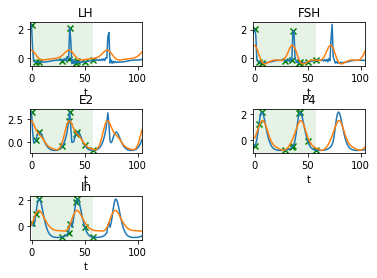

TRAIN individual number 1


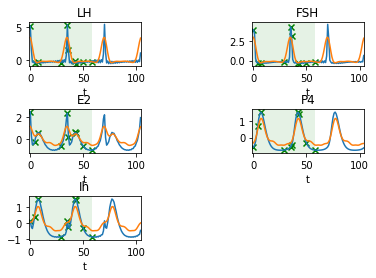

TRAIN individual number 2


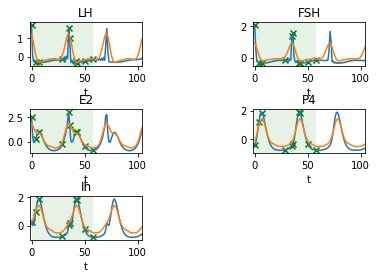

TRAIN individual number 3


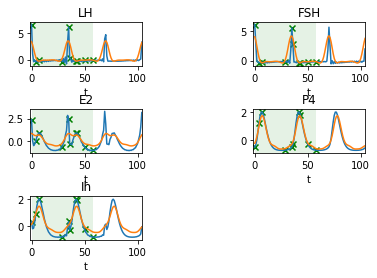

TRAIN individual number 4


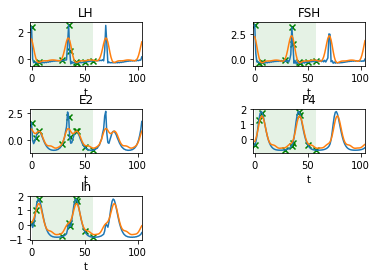

TRAIN individual number 5


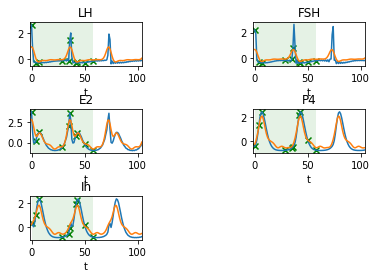

TRAIN individual number 6


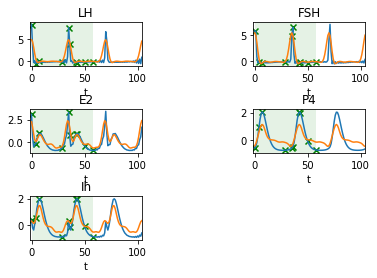

TRAIN individual number 7


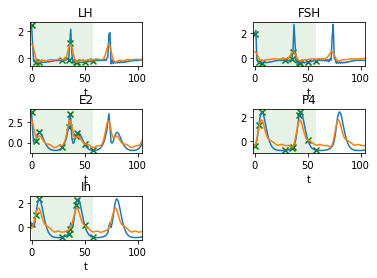

TRAIN individual number 8


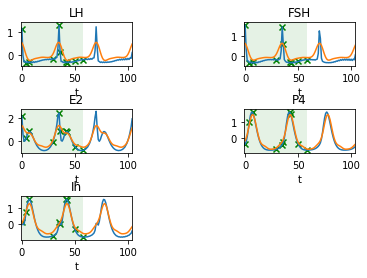

TRAIN individual number 9


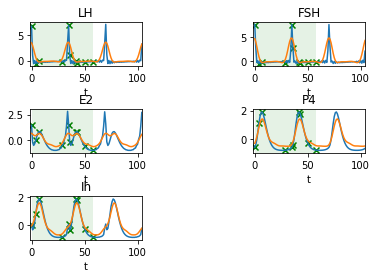

TRAIN individual number 10


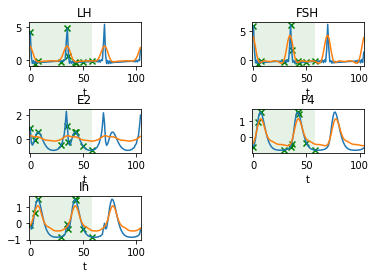

TRAIN individual number 11


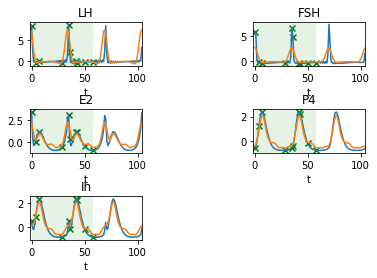

TRAIN individual number 12


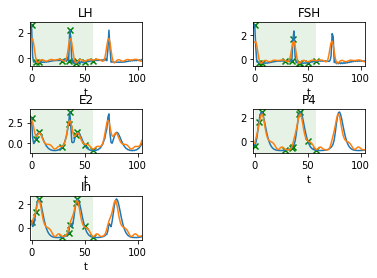

TRAIN individual number 13


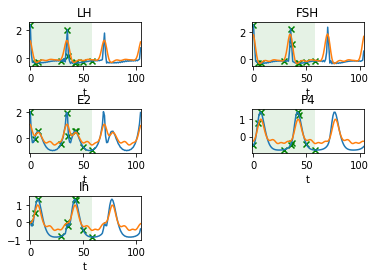

TRAIN individual number 14


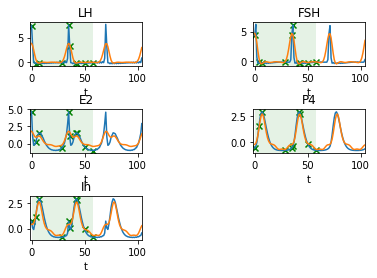

TRAIN individual number 15


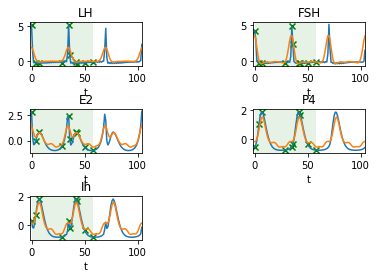

TRAIN individual number 16


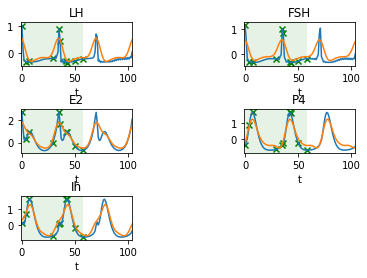

TRAIN individual number 17


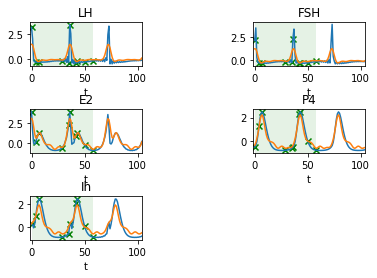

TRAIN individual number 18


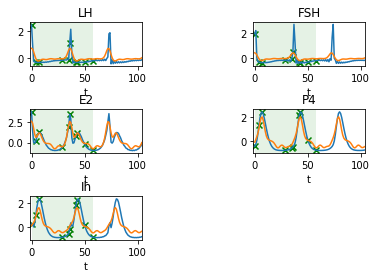

TRAIN individual number 19


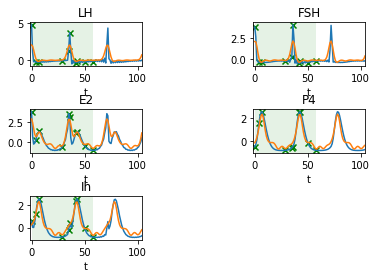

TRAIN individual number 20


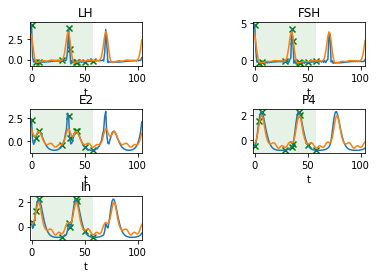

TRAIN individual number 21


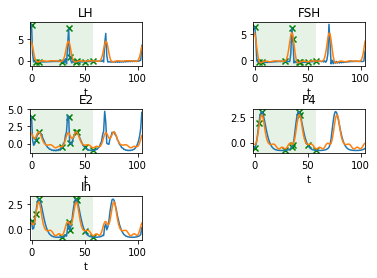

TRAIN individual number 22


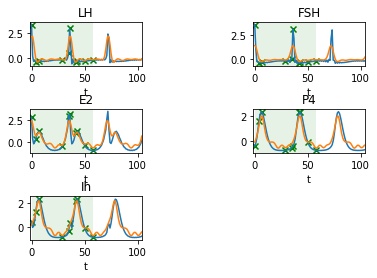

TRAIN individual number 23


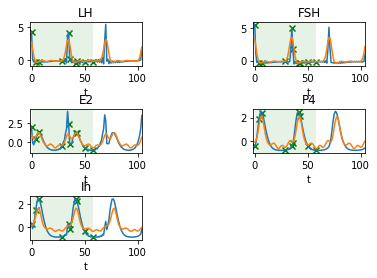

TRAIN individual number 24


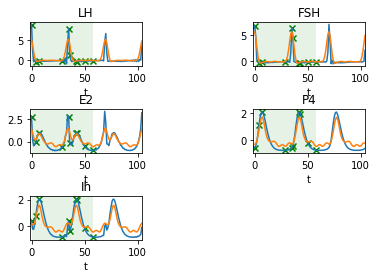

TRAIN individual number 25


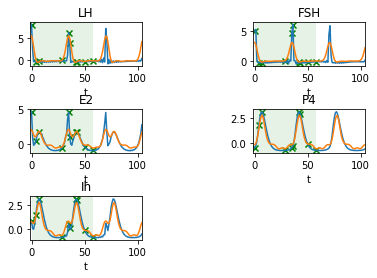

TRAIN individual number 26


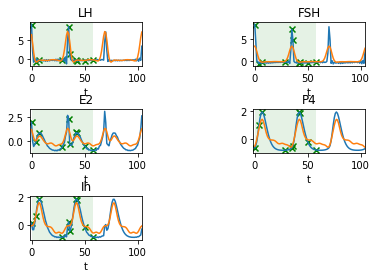

TRAIN individual number 27


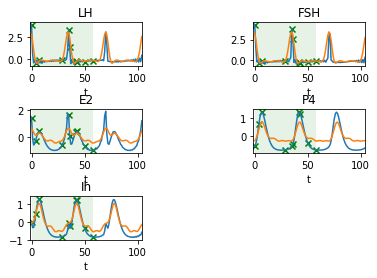

TRAIN individual number 28


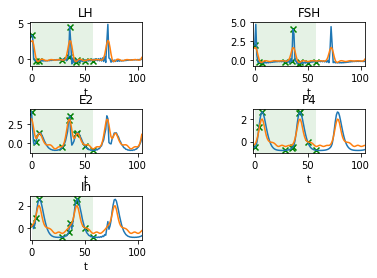

TRAIN individual number 29


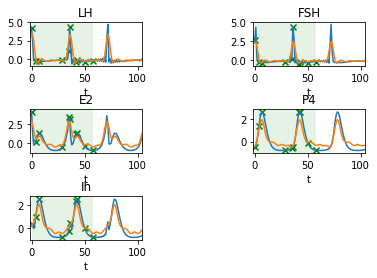

TRAIN individual number 30


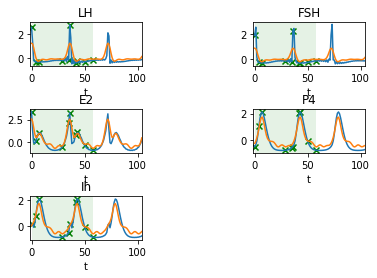

TRAIN individual number 31


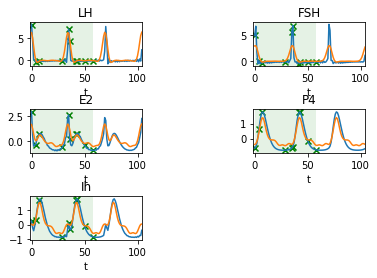

TRAIN individual number 32


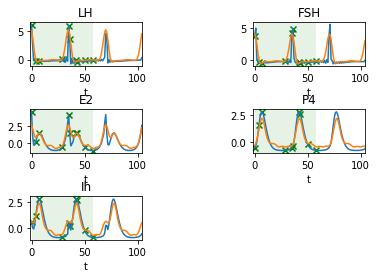

TRAIN individual number 33


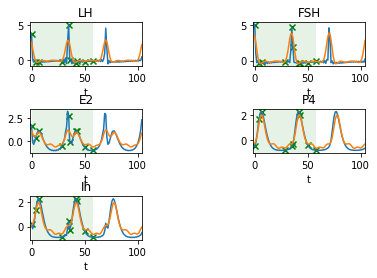

TRAIN individual number 34


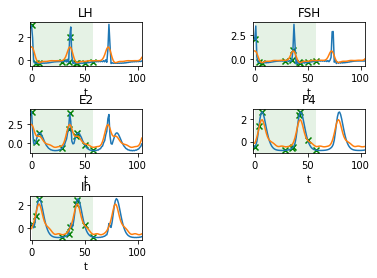

TRAIN individual number 35


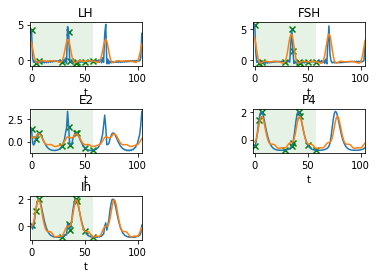

TRAIN individual number 36


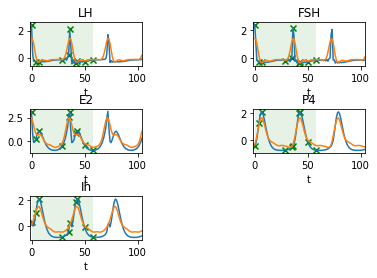

TRAIN individual number 37


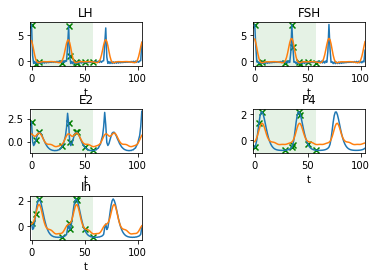

TRAIN individual number 38


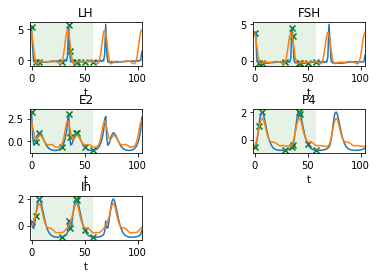

TRAIN individual number 39


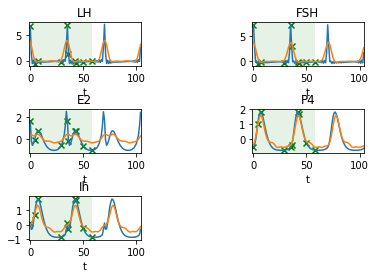

TRAIN validation individual number 40


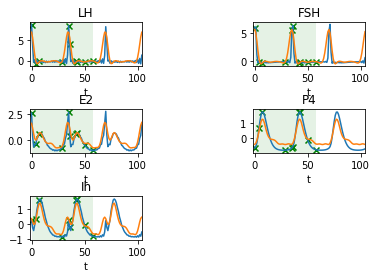

TRAIN validation individual number 41


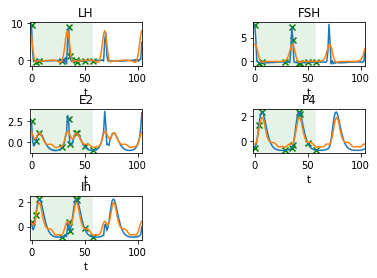

TRAIN validation individual number 42


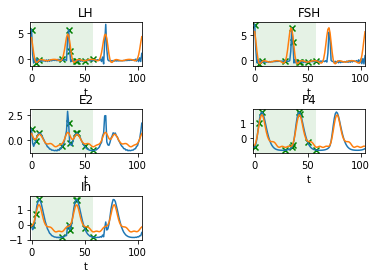

TRAIN validation individual number 43


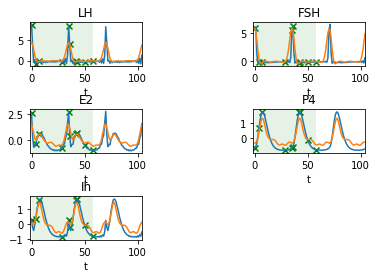

TRAIN validation individual number 44


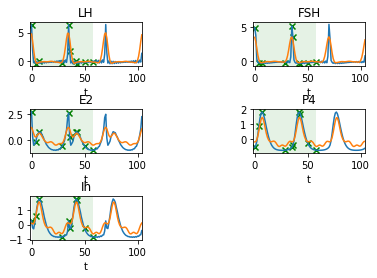

TRAIN validation individual number 45


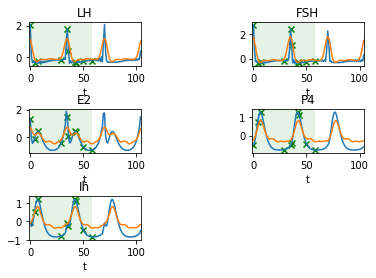

TRAIN validation individual number 46


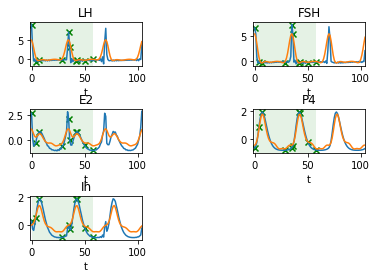

TRAIN validation individual number 47


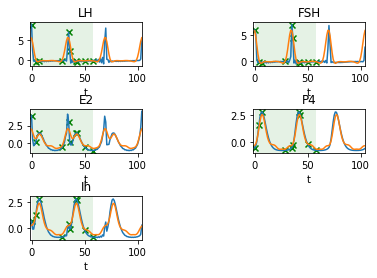

TRAIN validation individual number 48


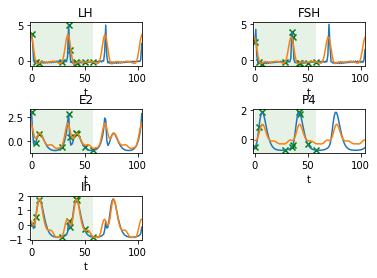

TRAIN validation individual number 49


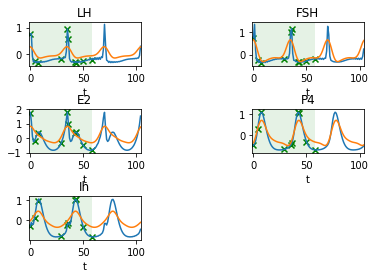

TEST individual number 50


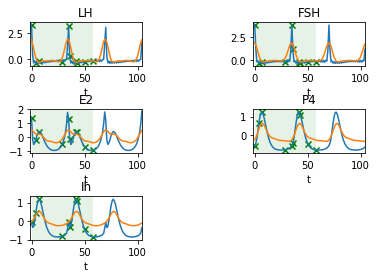

TEST individual number 51


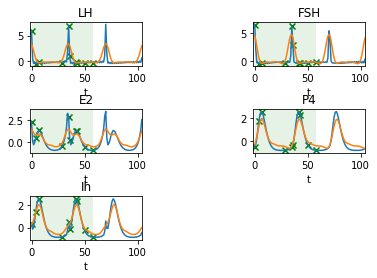

TEST individual number 52


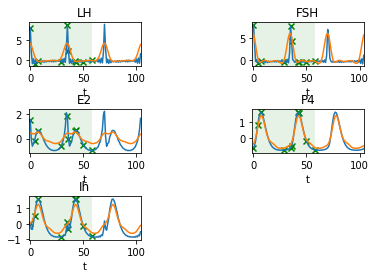

TEST individual number 53


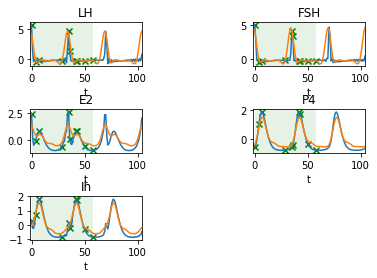

TEST individual number 54


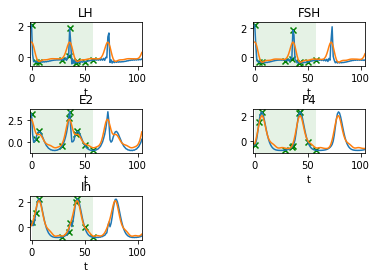

TEST individual number 55


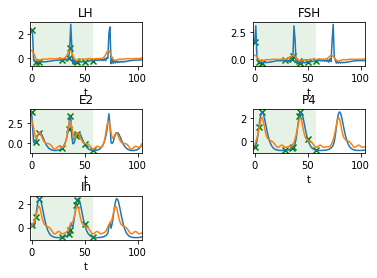

TEST individual number 56


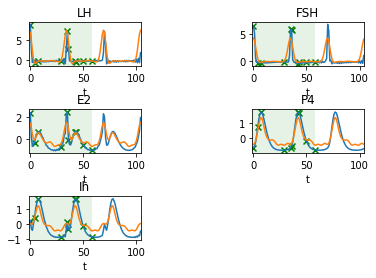

TEST individual number 57


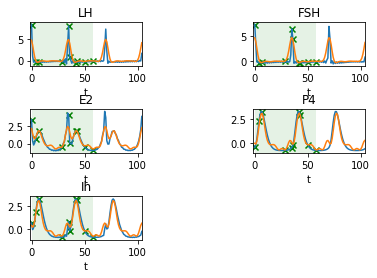

TEST individual number 58


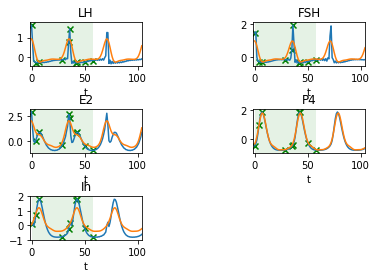

TEST individual number 59


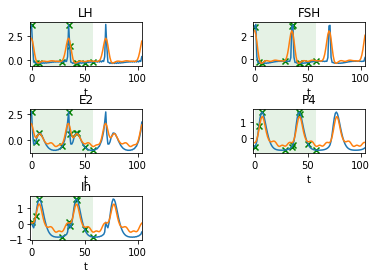

In [23]:
plot_y_reconstruct_and_predict(resampled_data, np.ones((nb_individuals,1),dtype=int)*np.array(ed_sampling_list), y_predicted, nb_individuals_train, nb_individuals_val, nb_individuals_test)

['covar_block_0', 'covar_block_1', 'mean_block_0', 'mean_block_1', 'y_predicted']
TRAIN individual number 0


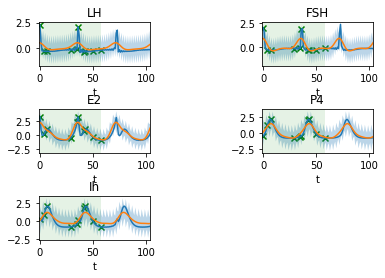

TRAIN individual number 1


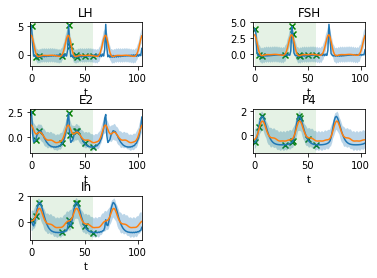

TRAIN individual number 2


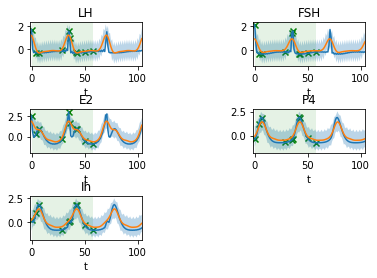

TRAIN individual number 3


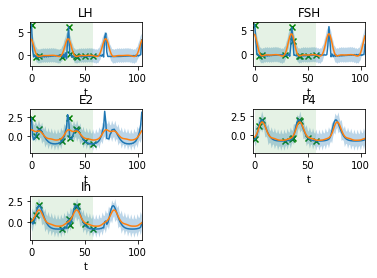

TRAIN individual number 4


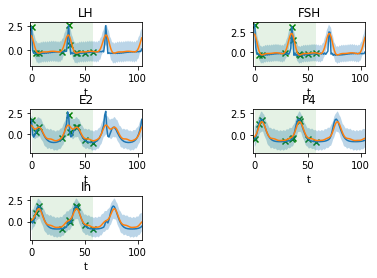

TRAIN individual number 5


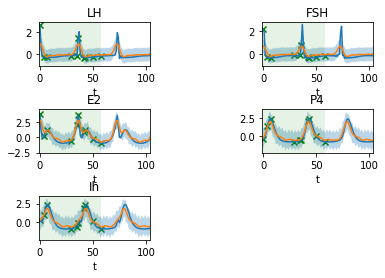

TRAIN individual number 6


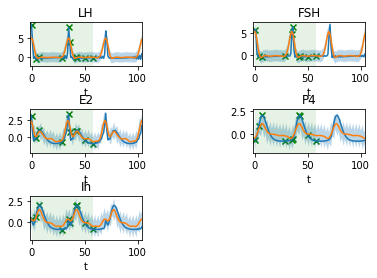

TRAIN individual number 7


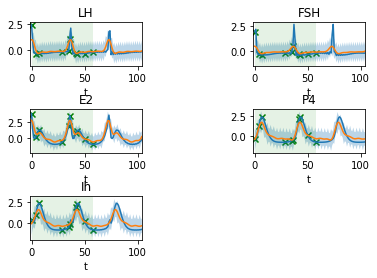

TRAIN individual number 8


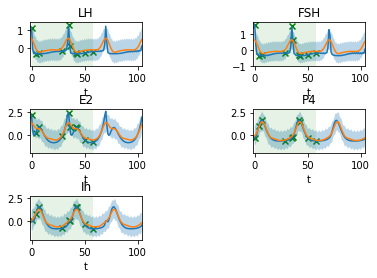

TRAIN individual number 9


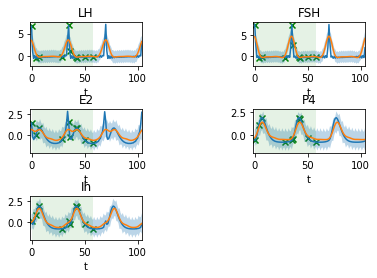

TRAIN individual number 10


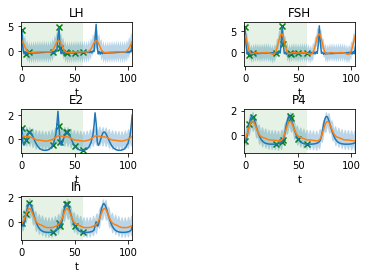

TRAIN individual number 11


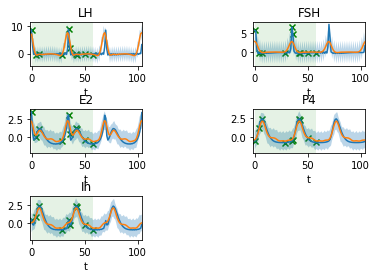

TRAIN individual number 12


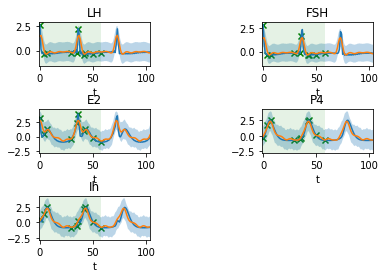

TRAIN individual number 13


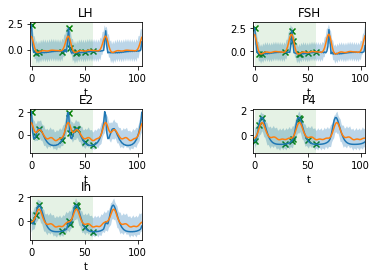

TRAIN individual number 14


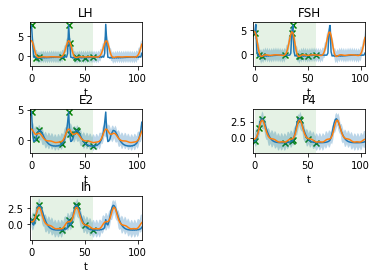

TRAIN individual number 15


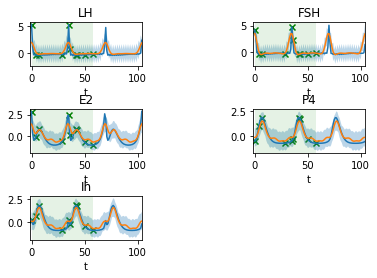

TRAIN individual number 16


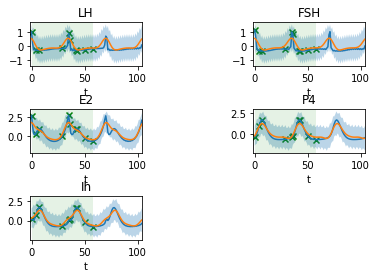

TRAIN individual number 17


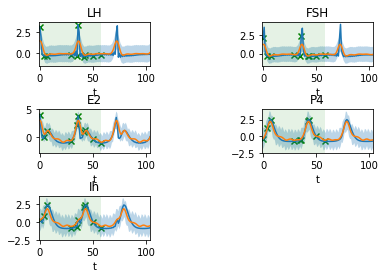

TRAIN individual number 18


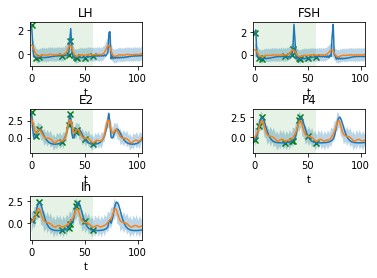

TRAIN individual number 19


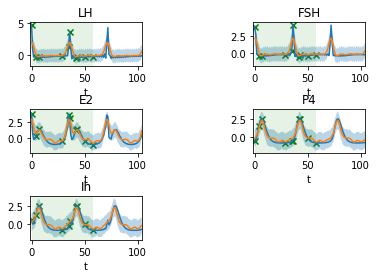

TRAIN individual number 20


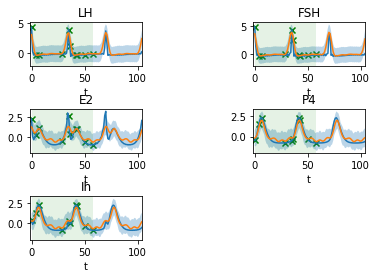

TRAIN individual number 21


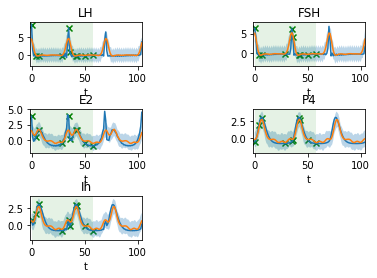

TRAIN individual number 22


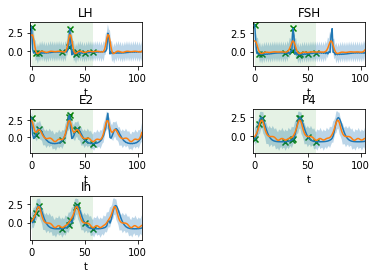

TRAIN individual number 23


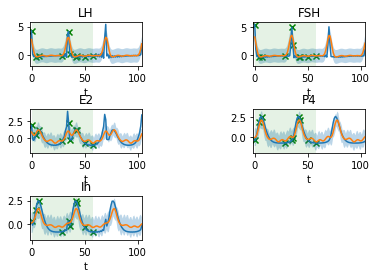

TRAIN individual number 24


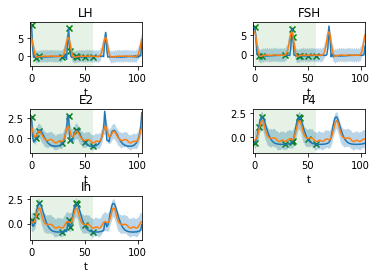

TRAIN individual number 25


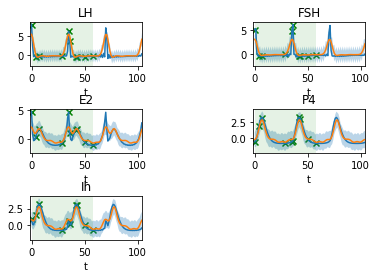

TRAIN individual number 26


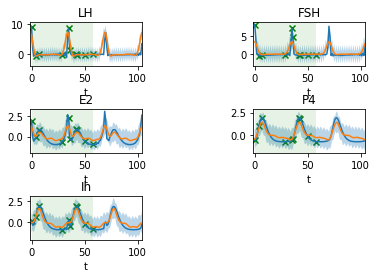

TRAIN individual number 27


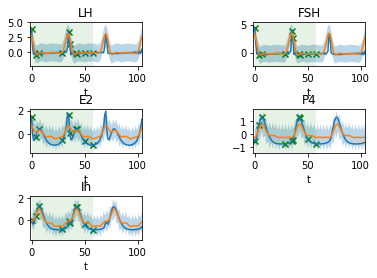

TRAIN individual number 28


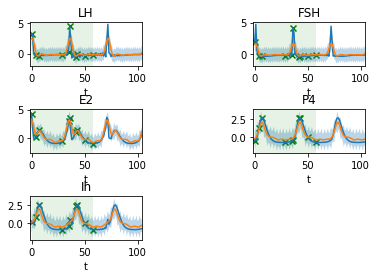

TRAIN individual number 29


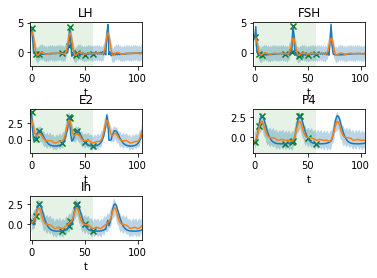

TRAIN individual number 30


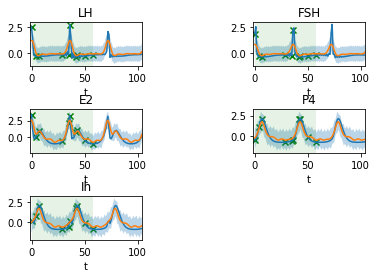

TRAIN individual number 31


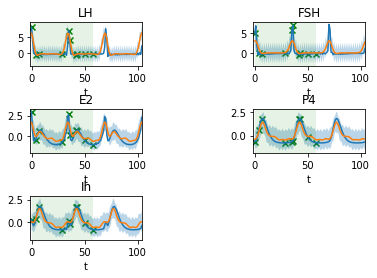

TRAIN individual number 32


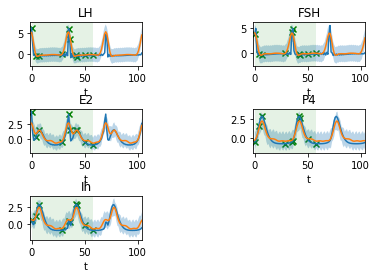

TRAIN individual number 33


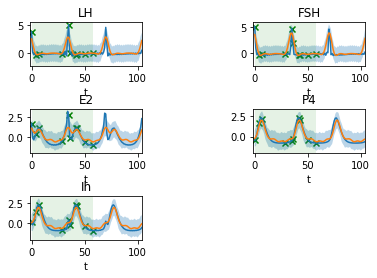

TRAIN individual number 34


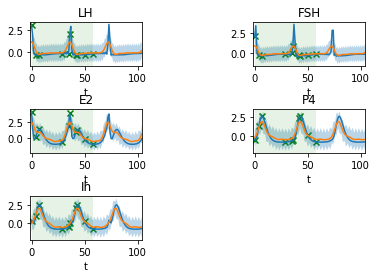

TRAIN individual number 35


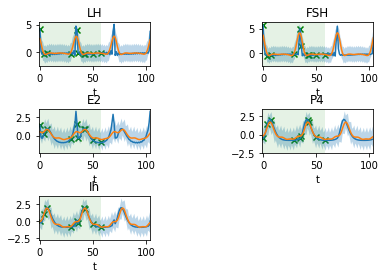

TRAIN individual number 36


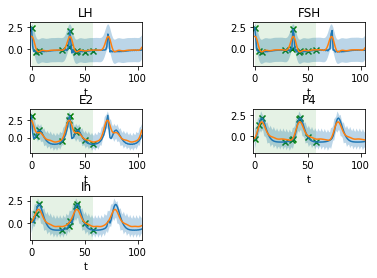

TRAIN individual number 37


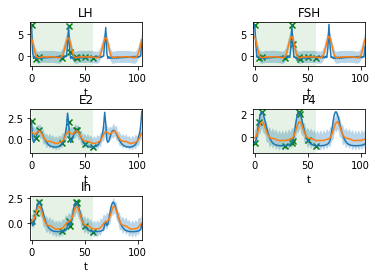

TRAIN individual number 38


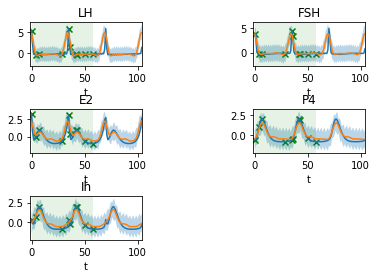

TRAIN individual number 39


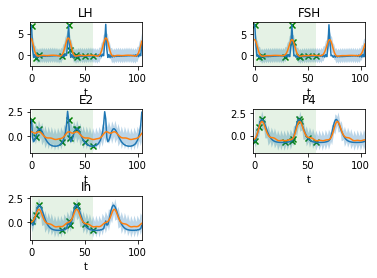

TRAIN validation individual number 40


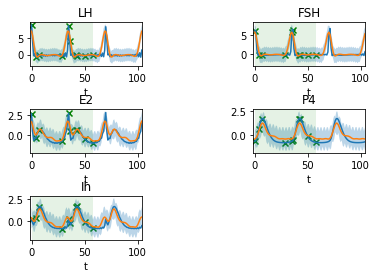

TRAIN validation individual number 41


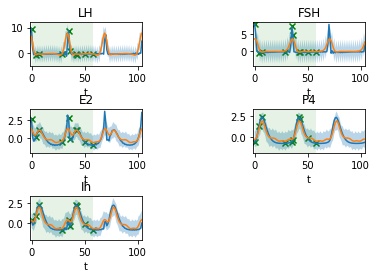

TRAIN validation individual number 42


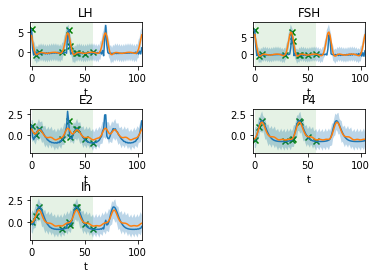

TRAIN validation individual number 43


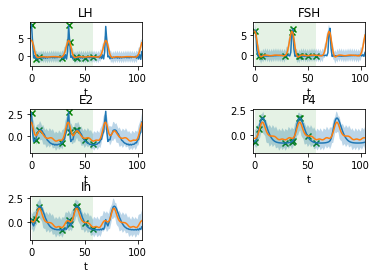

TRAIN validation individual number 44


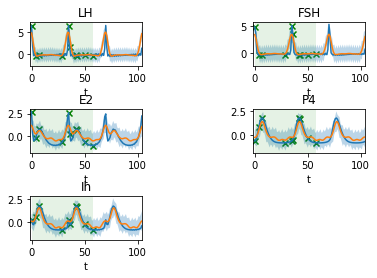

TRAIN validation individual number 45


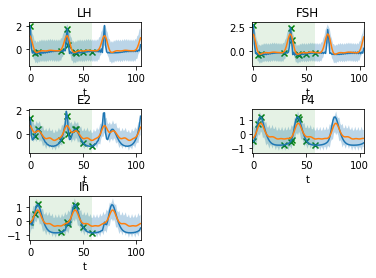

TRAIN validation individual number 46


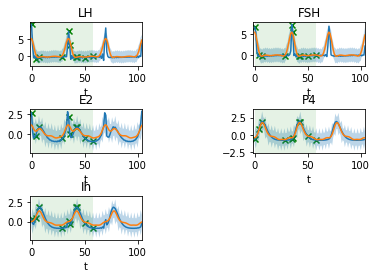

TRAIN validation individual number 47


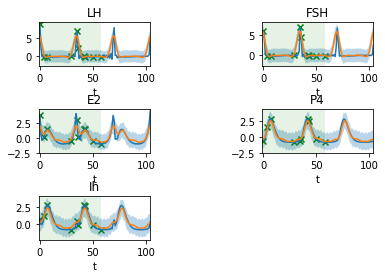

TRAIN validation individual number 48


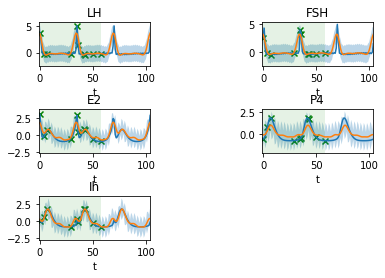

TRAIN validation individual number 49


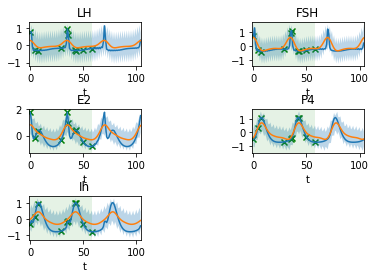

TEST individual number 50


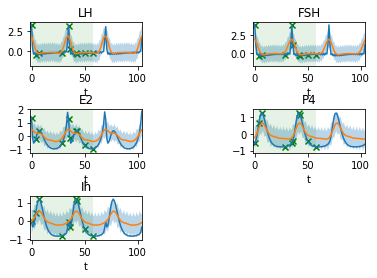

TEST individual number 51


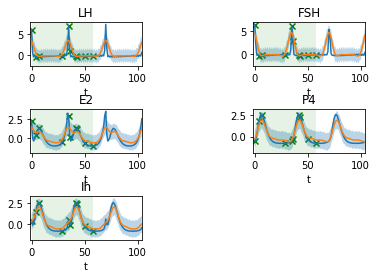

TEST individual number 52


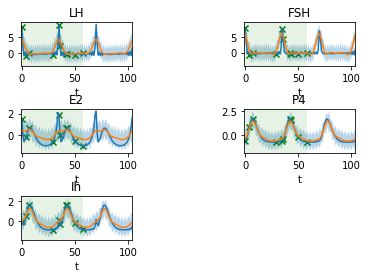

TEST individual number 53


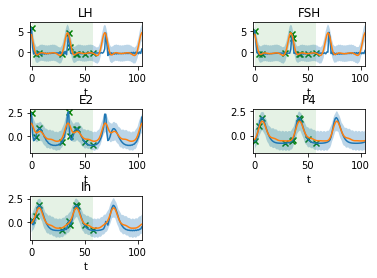

TEST individual number 54


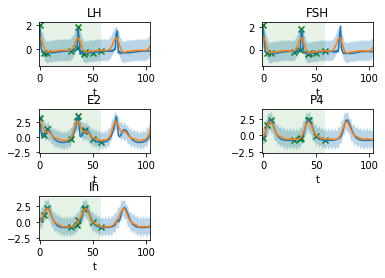

TEST individual number 55


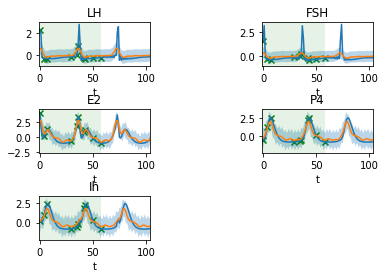

TEST individual number 56


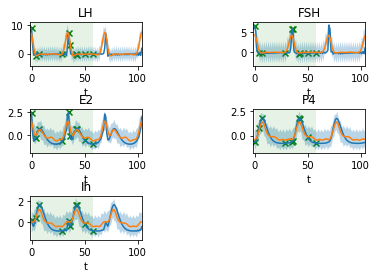

TEST individual number 57


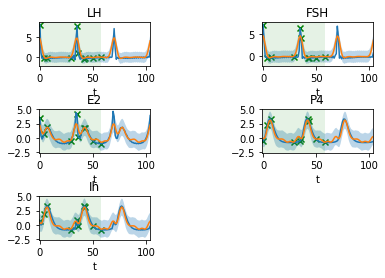

TEST individual number 58


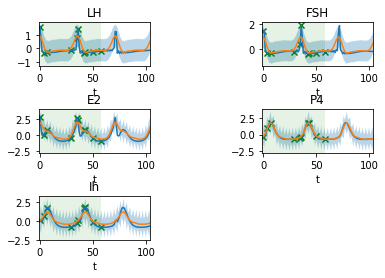

TEST individual number 59


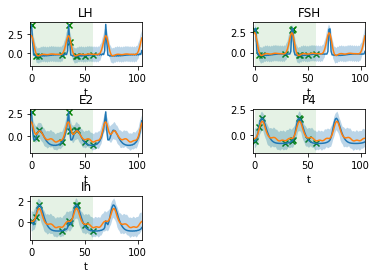

In [24]:
# GP visualization
# Recover GP mean and covariance
y_mean_predicted=np.empty_like(resampled_data)
y_var_predicted=np.empty_like(resampled_data)
with h5py.File(h5_dataset_path, 'r') as trained_GPs:
    print(list(trained_GPs.keys()))
    for i in np.arange(len(block_indices)):
        for h_idx,h in enumerate(block_indices[i]):
            y_mean_predicted[:,:,h]=trained_GPs['mean_block_{}'.format(i)][:,:,h_idx]
            y_var_predicted[:,:,h]=np.diagonal(trained_GPs['covar_block_{}'.format(i)][:,nb_time_steps*h_idx:nb_time_steps*(h_idx+1),nb_time_steps*h_idx:nb_time_steps*(h_idx+1)],axis1=1, axis2=2)

# Visualize GP prediction 
plot_y_GP_reconstruct_and_predict(resampled_data, np.ones((nb_individuals,1),dtype=int)*np.array(ed_sampling_list),
                                  y_mean_predicted, y_var_predicted,
                                  nb_individuals_train, nb_individuals_val, nb_individuals_test)

# 2 ] DCNN

## 2.1 Build a learning dataset from the ouput of the MGPs

### And we build our dataset...
#### Inputs :
- **output_gp_path** : the path of the trained MGP output file (created above, which contain the mean and covariance matrices of the Block MGP)
- **y_true** : the full resampled data array
- **nb_samples_per_id**  (default=1):
    if = 1 : we just take the mean as input for the DCNN,
    if >1 : we sample 'nb_samples_per_id' posteriors from each individual distribution...
- **plot_some_posteriors** : to see the shapes of some posteriors...

In [25]:
# Get MGP posterior sample streams
x_train, y_train, x_val, y_val, x_test, y_test = import_and_split_data_train_val_test(output_gp_path = h5_dataset_path,
                                                                                            y_true = resampled_data,
                                                                                            block_indices= block_indices,
                                                                                            nb_timesteps = nb_time_steps,
                                                                                            nb_tasks = nb_input_tasks,
                                                                                            nb_individuals = nb_individuals,
                                                                                            nb_individuals_train = nb_individuals_train,
                                                                                            nb_individuals_val = nb_individuals_val,
                                                                                            nb_individuals_test = nb_individuals_test,
                                                                                            nb_samples_per_id=nb_samples_per_id,
                                                                                            plot_some_posteriors = False)

# Note that the dataset contains nb_samples_per_id consecutive posteriors for each same individual

../../src/MGP_DCNN/data_processing.py:160: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  return np.random.multivariate_normal(gp_out_mean, covar_matrix, num_samples)


## 2.2 Build the Neural Network

First we build our object (Time_Neural_Network class) by specifying parameters that will be fixed for any network :

    - batch_size: number of individuals to use for training
    - nb_epochs: number of epochs to train the model
    
Once again, **those parameters will be fixed for all the networks during the Bayesian Optimization.**

In [26]:
dcnn_batch_size=50
dcnn_nb_epochs=500

In [27]:
# Initialize
network = Time_Neural_Network('CNN', dcnn_batch_size, dcnn_nb_epochs,
                                x_train=x_train, y_train=y_train,
                                x_val=x_val, y_val=y_val,
                                x_test=x_test, y_test=y_test,
                                main_dir=main_dir,
                                exec_type=exec_type,
                                train_sampling_type=train_sampling_type)

**The architecture parameters (learning rate, nb_layers,...) can be manually specified (section 2.3) or automatically learned via Bayesian optimization (section 2.4)**

## 2.3 Train the network, based on manually inputed parameters

In [28]:
# DCNN parameters
dcnn_learning_rate=2e-3
dcnn_nb_hidden_layers=5
dcnn_nb_filters=8
dcnn_regularizer_coef=1e-7
dcnn_kernel_size=6
dcnn_dilation_factor=2

In [29]:
# Build, based on manually inputed parameters
network.build_TNN(learning_rate=dcnn_learning_rate, 
                  nb_hidden_layers=dcnn_nb_hidden_layers, 
                  nb_filters=dcnn_nb_filters,
                  regularizer_coef=dcnn_regularizer_coef, 
                  kernel_size=dcnn_kernel_size, 
                  dilation_factor=dcnn_dilation_factor, 
                  display_summary=False)

## 2.4 Bayesian Optimization
#### Find the best hyperparameters for the neural network using Bayesian Optimization and Expected Improvement

Parameters for the Bayesian optimization, which is done with respect to the **validation loss**
   - **nb_calls** : the number of neural networks we are going to try, for each one the validation loss is computed
   - **nb_random_start** : nb of random calls to the routine

In [30]:
# Bayesian Optimization of DCNN
bo_nb_calls = 6
bo_nb_random_starts = 5
# Set potential parameter ranges
bo_learning_rate = Real(low=0.5e-3, high=2e-2, prior='log-uniform', name='learning_rate')
bo_nb_hidden_layers = Integer(low=3, high=6, name='nb_layers')
bo_nb_filters = Integer(low=5, high=12, name='nb_filters')
bo_regularizer_coef = Real(low=1e-8, high=1e-3, prior='log-uniform', name='regularizer_coef')
bo_kernel_size = Integer(low=2, high=9, name='kernel_size')
bo_dilation_factor = Integer(low=2, high=3, name='kernel_size')
bo_parameters_range = [bo_learning_rate,bo_nb_hidden_layers,bo_nb_filters,bo_regularizer_coef, bo_kernel_size, bo_dilation_factor]
bo_default_parameters = [dcnn_learning_rate, dcnn_nb_hidden_layers, dcnn_nb_filters, dcnn_regularizer_coef, dcnn_kernel_size, dcnn_dilation_factor]

In [31]:
# Train with Bayesian Optimization in validation set
search_result = network.optimization_process(bo_parameters_range,
                                 default_parameters=bo_default_parameters,
                                 nb_calls = bo_nb_calls,
                                 nb_random_starts = bo_nb_random_starts,
                                 plot_conv=False)

MGP+TNN: 	 Train loss=0.1616246683333293 (1.0850650433645452)
		 Validation loss=0.2063995460234309 (1.3283595695641832)
		 Test loss=0.17400580821257272 (1.173686479033847)
Time 116.3769474029541 Learning_rate  0.002  nb_layers  5  nb_filters  8  kernel_size  6  regularizer_coef  1e-07  dilation_factor  2
MGP+TNN: 	 Train loss=0.3135405742501336 (1.274534263496274)
		 Validation loss=0.34809994748369516 (1.4716673927645194)
		 Test loss=0.3353497782815374 (1.394113130451783)
Time 184.59090042114258 Learning_rate  0.0008046751106479956  nb_layers  4  nb_filters  10  kernel_size  2  regularizer_coef  0.00020315254594432665  dilation_factor  2
MGP+TNN: 	 Train loss=0.1661695690135879 (1.063209741669102)
		 Validation loss=0.202857352398711 (1.2857330752960552)
		 Test loss=0.1844368505344878 (1.1985381722721804)
Time 148.36326718330383 Learning_rate  0.0025240948221575874  nb_layers  6  nb_filters  7  kernel_size  7  regularizer_coef  4.940967792362017e-07  dilation_factor  2
MGP+TNN: 	 

In [32]:
index_min_val_loss = np.argmin(search_result.func_vals)
best_network=network.params_history[index_min_val_loss]
# Best predictions
ed_dcnn_predicted=network.y_predicted[index_min_val_loss]
# Evaluate losses
ed_dcnn_y_mse=(np.concatenate((y_train,y_val,y_test),axis=0)-ed_dcnn_predicted)**2
# Since we have nb_samples_per_id
ed_dcnn_y_mse_reshaped=np.reshape(ed_dcnn_y_mse, (nb_samples_per_id,nb_individuals,nb_time_steps,nb_input_tasks), order='F')
# Recompute per individual
ed_dcnn_y_mse=ed_dcnn_y_mse_reshaped.mean(axis=0)
print('MGP+DCNN with block indices {} and ED sampling with {} points selected for training, TEST LOSS={}'.format(block_indices, nb_selected_points, ed_dcnn_y_mse[(nb_individuals_train + nb_individuals_val):].mean()))

MGP+DCNN with block indices [[0, 1], [2, 3, 4]] and ED sampling with 10 points selected for training, TEST LOSS=0.12922556404057403


### Visualize reconstruction and prediction

In [33]:
# Since we have nb_samples_per_id
ed_dcnn_y_predicted=np.reshape(ed_dcnn_predicted, (nb_samples_per_id,nb_individuals,nb_time_steps,nb_input_tasks), order='F').mean(axis=0)

TRAIN individual number 0


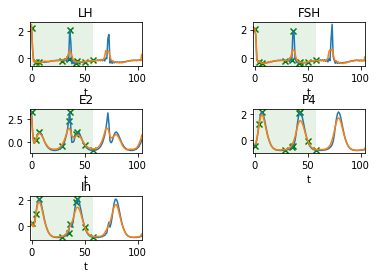

TRAIN individual number 1


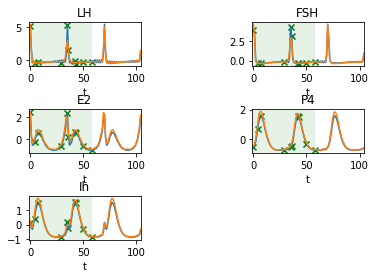

TRAIN individual number 2


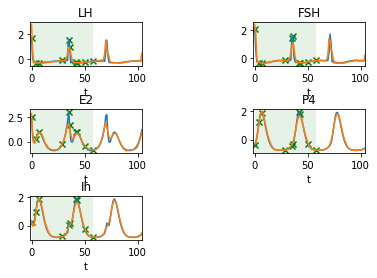

TRAIN individual number 3


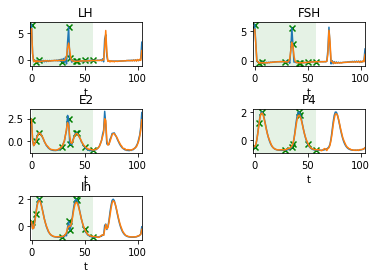

TRAIN individual number 4


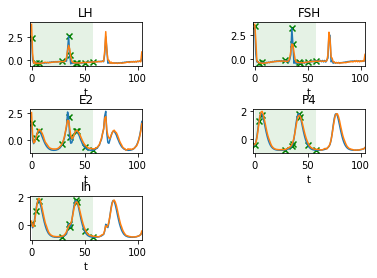

TRAIN individual number 5


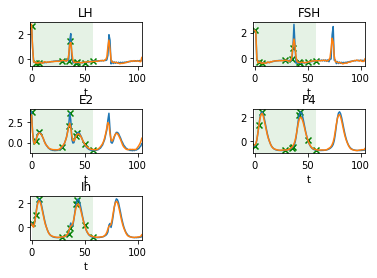

TRAIN individual number 6


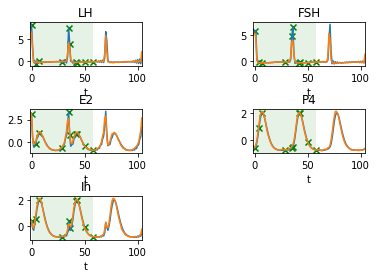

TRAIN individual number 7


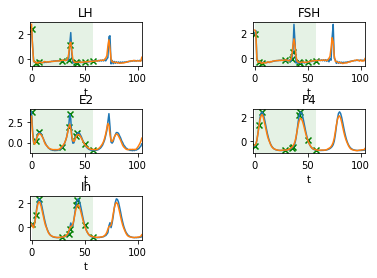

TRAIN individual number 8


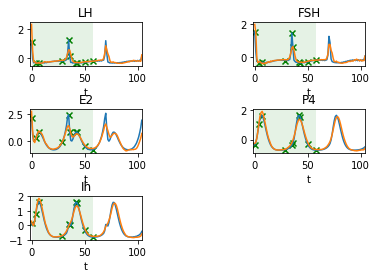

TRAIN individual number 9


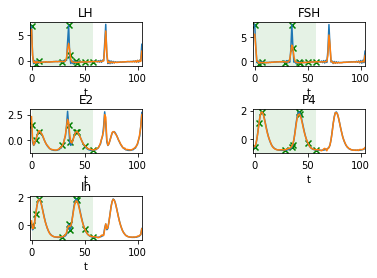

TRAIN individual number 10


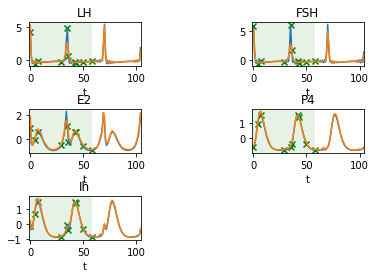

TRAIN individual number 11


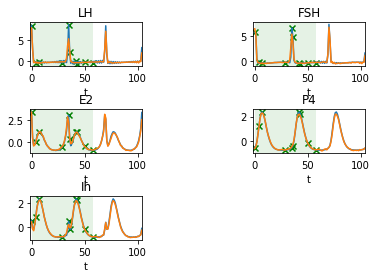

TRAIN individual number 12


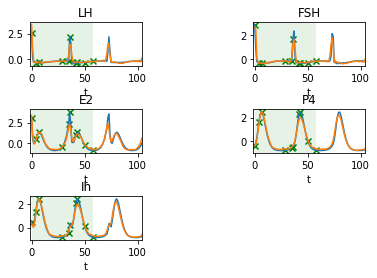

TRAIN individual number 13


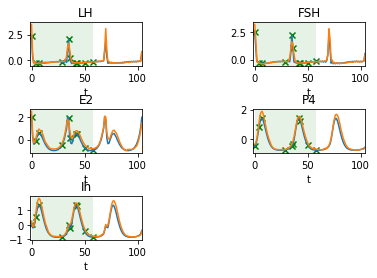

TRAIN individual number 14


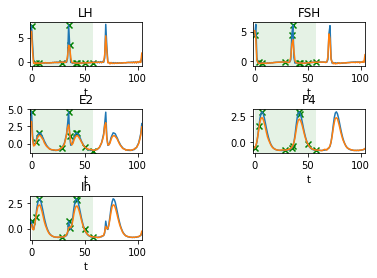

TRAIN individual number 15


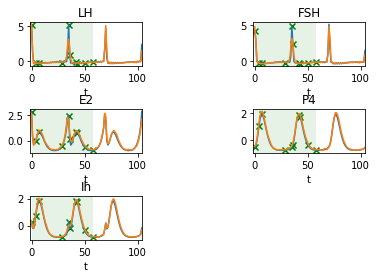

TRAIN individual number 16


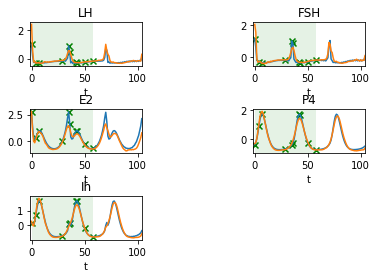

TRAIN individual number 17


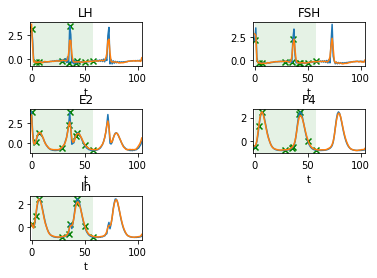

TRAIN individual number 18


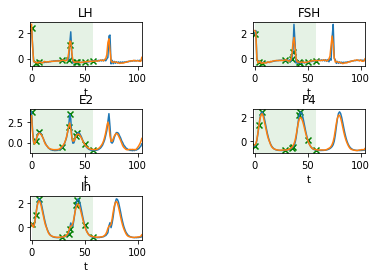

TRAIN individual number 19


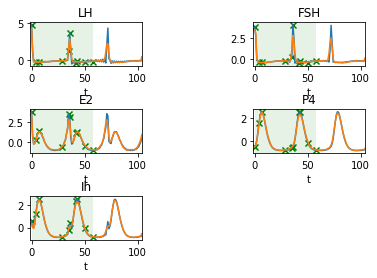

TRAIN individual number 20


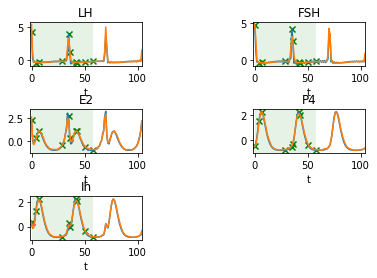

TRAIN individual number 21


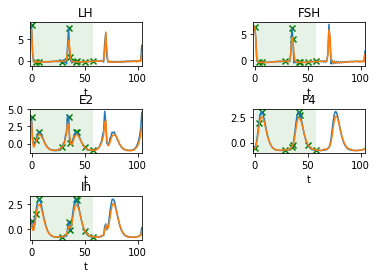

TRAIN individual number 22


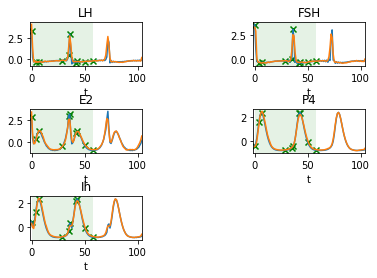

TRAIN individual number 23


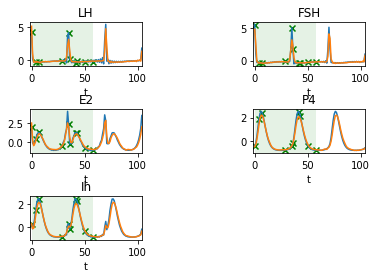

TRAIN individual number 24


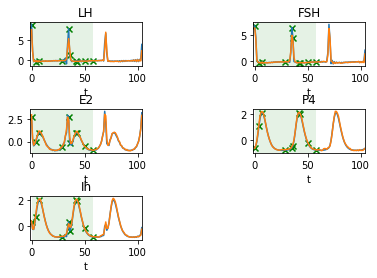

TRAIN individual number 25


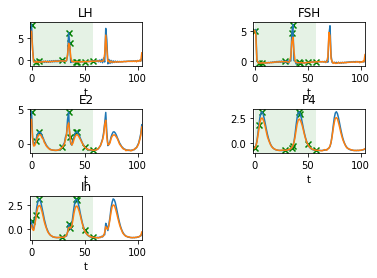

TRAIN individual number 26


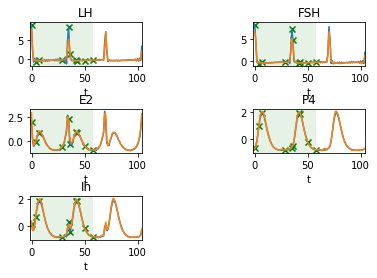

TRAIN individual number 27


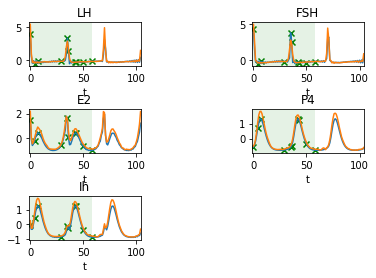

TRAIN individual number 28


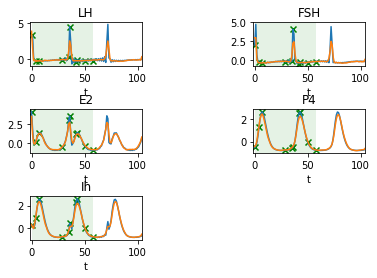

TRAIN individual number 29


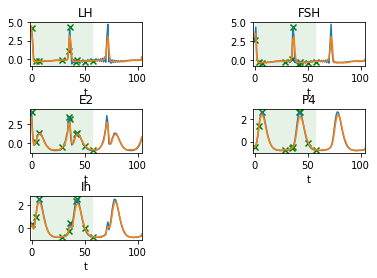

TRAIN individual number 30


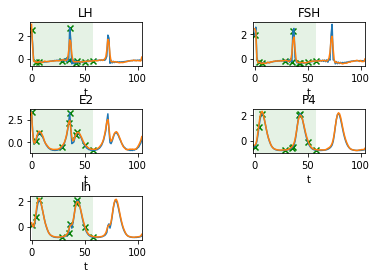

TRAIN individual number 31


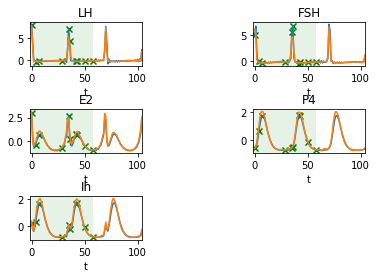

TRAIN individual number 32


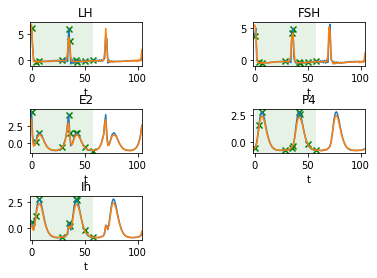

TRAIN individual number 33


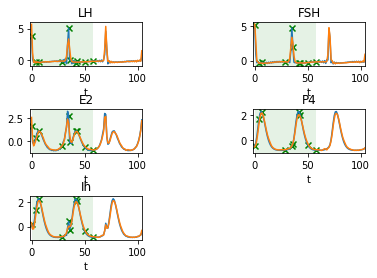

TRAIN individual number 34


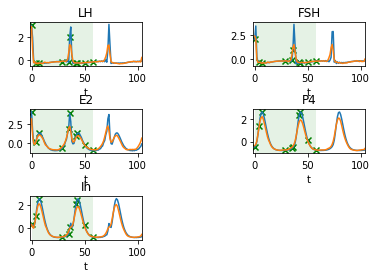

TRAIN individual number 35


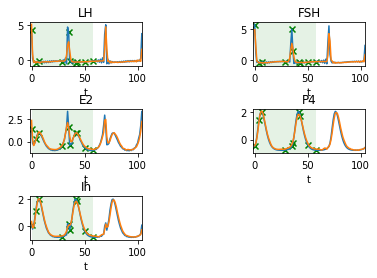

TRAIN individual number 36


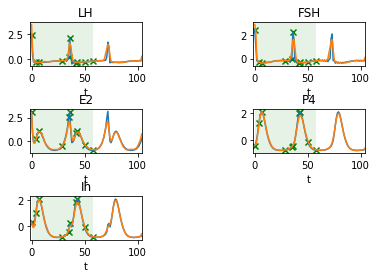

TRAIN individual number 37


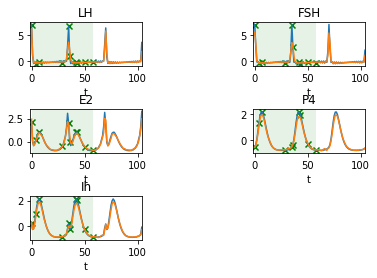

TRAIN individual number 38


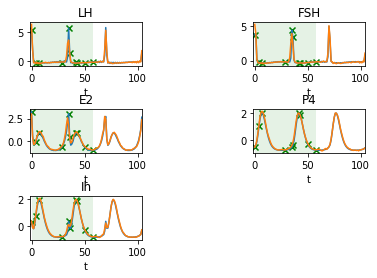

TRAIN individual number 39


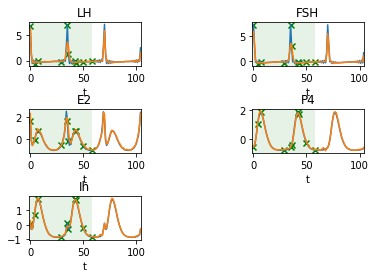

TRAIN validation individual number 40


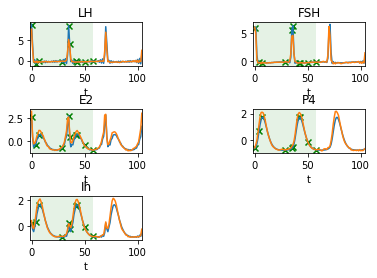

TRAIN validation individual number 41


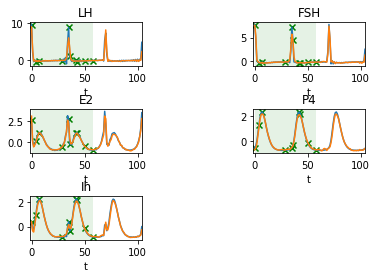

TRAIN validation individual number 42


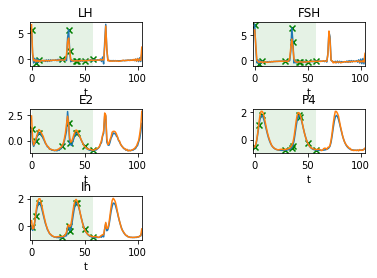

TRAIN validation individual number 43


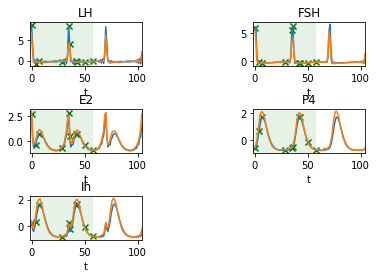

TRAIN validation individual number 44


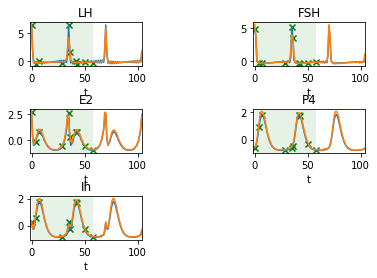

TRAIN validation individual number 45


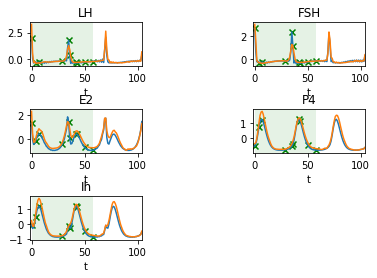

TRAIN validation individual number 46


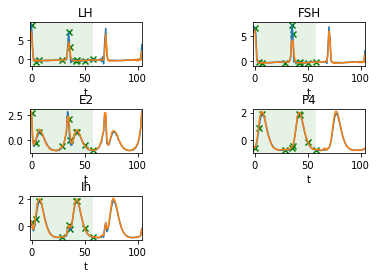

TRAIN validation individual number 47


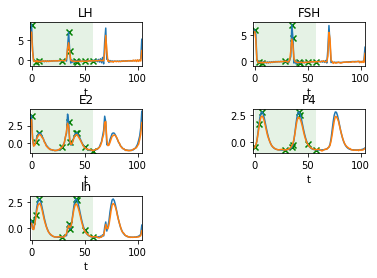

TRAIN validation individual number 48


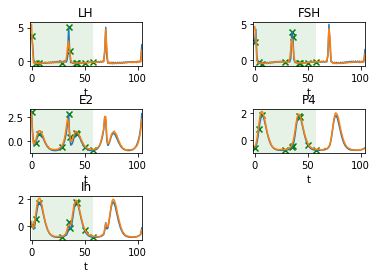

TRAIN validation individual number 49


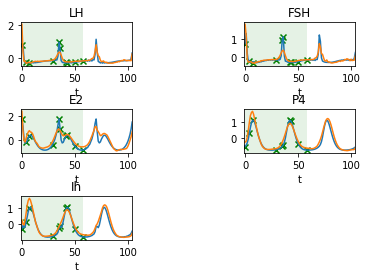

TEST individual number 50


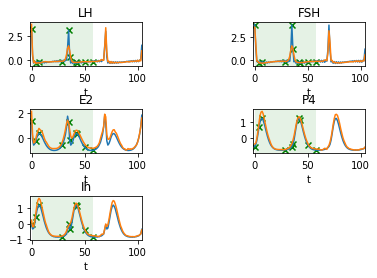

TEST individual number 51


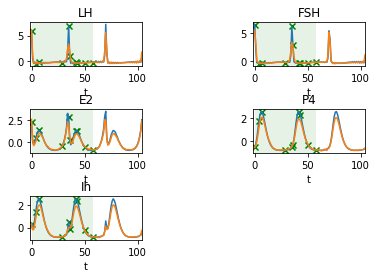

TEST individual number 52


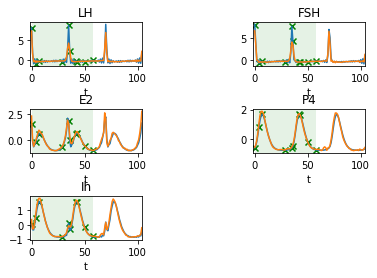

TEST individual number 53


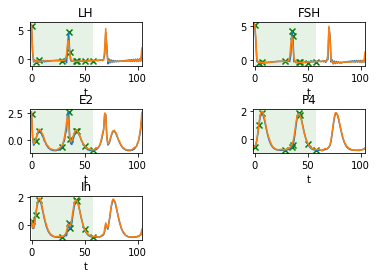

TEST individual number 54


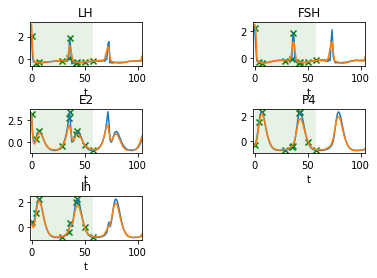

TEST individual number 55


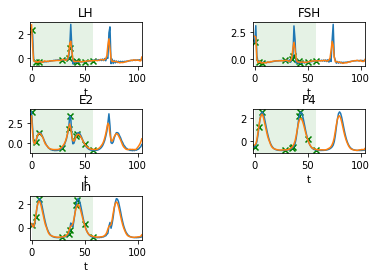

TEST individual number 56


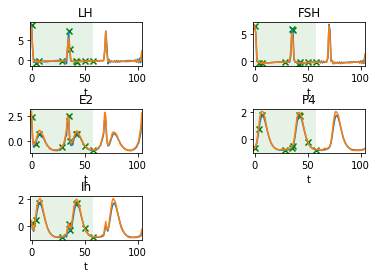

TEST individual number 57


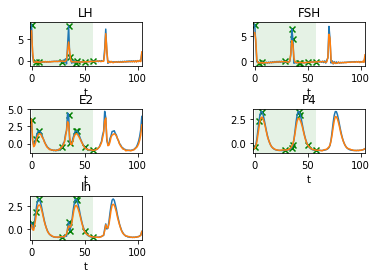

TEST individual number 58


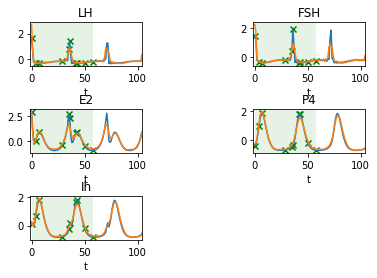

TEST individual number 59


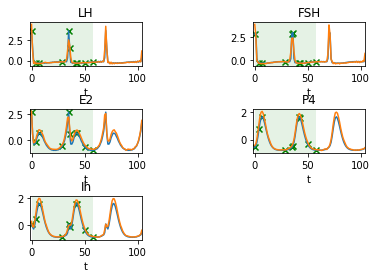

In [34]:
plot_y_reconstruct_and_predict(resampled_data, np.ones((nb_individuals,1),dtype=int)*np.array(ed_sampling_list), ed_dcnn_y_predicted, nb_individuals_train, nb_individuals_val, nb_individuals_test)